# Import Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import pandas
import pandas as pd

# read dataset
train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Business Analytics/Assignment 3/assignment.csv")
comp_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Business Analytics/Assignment 3/kaggle.csv")

# show information about dataset
train.info()
comp_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121271 entries, 0 to 121270
Data columns (total 19 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ID                         121271 non-null  int64  
 1   potential                  121271 non-null  int64  
 2   age                        121271 non-null  int64  
 3   league_level               121271 non-null  float64
 4   skill_moves                121271 non-null  int64  
 5   preferred_foot             121271 non-null  object 
 6   international_reputation   121271 non-null  int64  
 7   pace                       121271 non-null  float64
 8   shooting                   121271 non-null  float64
 9   passing                    121271 non-null  float64
 10  dribbling                  121271 non-null  float64
 11  defending                  121271 non-null  float64
 12  value_eur                  121271 non-null  float64
 13  club_contract_valid_until  12

# CAS BDAI CUP SUBMISSION NOTEBOOK



# 1 Preprocessing

Zuerst bearbeiten wir das Dataset so, dass wir damit arbeiten können. Dazu entfernen wir Werte wie z.B. stirngs und objects. Wir könnten mit Dummy-Variablen arbeiten, verzichten aber darauf, da das Dataset schon gross genug ist und wir davon ausgehen, dass der Name des Spielers und des Vereins, der stärkeren Fuss, wie auch die Position auf der der Spieler spielt keinen massgeblichen Einfluss hat, sondern seine Skills wie das Passen, Schiessen und Dribbling massgeblich sind.

Zunächst bearbeiten wir den Datensatz so, dass wir mit ihm arbeiten können. Dazu entfernen wir Strings und Objekte. Wir könnten mit Dummy-Variablen arbeiten, weil der Datensatz bereits gross genug ist und wir davon ausgehen, dass der Name des Spielers und des Vereins, der stärkere Fuss und die Position keinen signifikanten Einfluss haben, tun wir dies nicht.

In [ ]:
train["player_positions"]

0                 CF
1             LW, LM
2         RM, LM, RW
3                 ST
4                 GK
             ...    
121266            CB
121267            CM
121268            CM
121269            ST
121270            CM
Name: player_positions, Length: 121271, dtype: object

In [ ]:
# drop categorical data
train = train.select_dtypes(exclude=['object'])
comp_data = comp_data.select_dtypes(exclude=['object'])

In [ ]:
# change to flaots
train = train.astype(float)

## 1.1 Data Overview

In [ ]:
train

,ID,potential,age,league_level,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,value_eur,club_contract_valid_until,height_cm,year
0,0.0,95.0,27.0,1.0,4.0,5.0,93.0,89.0,86.0,96.0,27.0,100500000.0,2018.0,169.0,2015.0
1,1.0,92.0,29.0,1.0,5.0,5.0,93.0,93.0,81.0,91.0,32.0,79000000.0,2018.0,185.0,2015.0
2,2.0,90.0,30.0,1.0,4.0,5.0,93.0,86.0,83.0,92.0,32.0,54500000.0,2017.0,180.0,2015.0
3,3.0,90.0,32.0,1.0,4.0,5.0,76.0,91.0,81.0,86.0,34.0,52500000.0,2016.0,195.0,2015.0
4,4.0,90.0,28.0,1.0,1.0,5.0,70.0,65.8,78.0,79.6,69.4,63500000.0,2019.0,193.0,2015.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121266,122835.0,52.0,21.0,1.0,2.0,1.0,58.0,23.0,26.0,27.0,50.0,70000.0,2020.0,177.0,2021.0
121267,122836.0,53.0,21.0,1.0,2.0,1.0,58.0,32.0,49.0,47.0,43.0,70000.0,2022.0,174.0,2021.0
121268,122837.0,47.0,28.0,1.0,2.0,1.0,65.0,37.0,49.0,46.0,40.0,45000.0,2022.0,185.0,2021.0
121269,122838.0,67.0,17.0,4.0,2.0,1.0,70.0,46.0,40.0,53.0,16.0,130000.0,2021.0,171.0,2021.0


In der Grafik unten sehen wir, dass mit zunehmender Pace des Spielers auch sein Marktwert steigt.

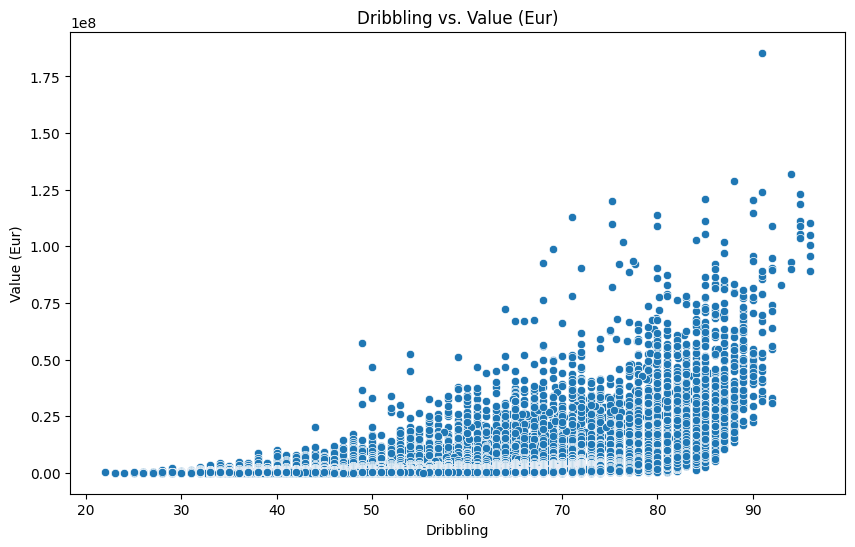

In [ ]:
# import
import matplotlib.pyplot as plt
import seaborn as sns

# create plot pace vs value
plt.figure(figsize=(10, 6))
sns.scatterplot(data=train, x='dribbling', y='value_eur')

#set title and labels
plt.title('Dribbling vs. Value (Eur)')
plt.ylabel('Value (Eur)')
plt.xlabel('Dribbling')

# show
plt.show()

Nachfolgend wird ein Pairplot erstellt, um zu sehen, wie die Beziehungen zwischen den Features aussehen. Es fällt auf, dass der value_eur positiv beeinflusst wird, je höher die Variablen Potential, Pace, Shooting, Passing und Dribbling sind. Ein höheres Alter hat einen negativen Einfluss auf den Marktwert des Spielers.

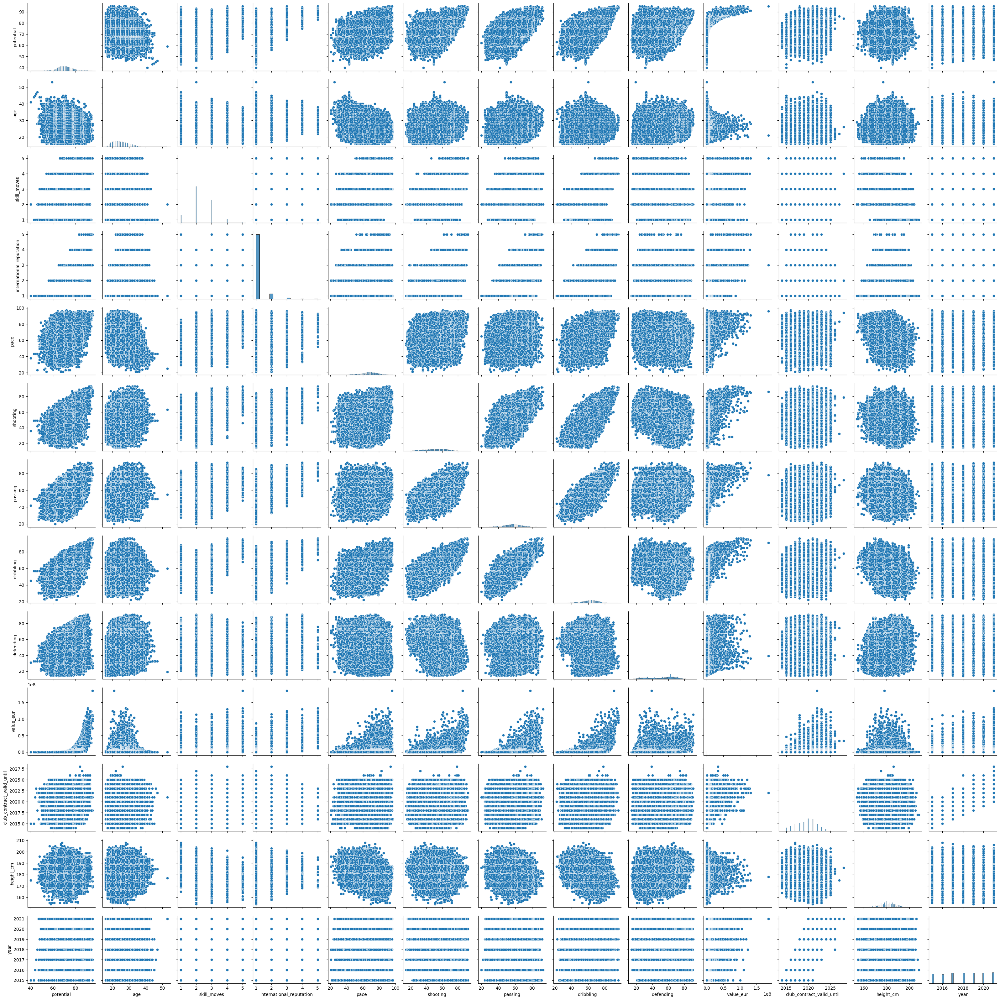

In [ ]:
#import
import seaborn as sns

# create pairplot
unscaled_pairplot = sns.pairplot(train[["potential",
                                           "age",
                                           "skill_moves",
                                           "international_reputation",
                                           "pace",
                                           "shooting",
                                           "passing",
                                           "dribbling",
                                           "defending",
                                           "value_eur",
                                            "club_contract_valid_until",
                                            "height_cm",
                                            "year"]],
                                 diag_kind='hist')

## 1.2 Feature Scaling
Wir skalieren nun unsere Daten und erstellen dazu ein neues Dataframe . Zum skalieren verwenden wir den RobustScaler, da dieser im Gegensatz z.B. zum MinMax Scaler Outliers gut handeln kann und zudem asymmetrie in der Verteilung gut handelt. Die Target Variable value_eur wird nicht skaliert und nach dem Skalierungsprozess dem neuen Dataframe df_scaled wieder drangehängt.

Wir skalieren nun unsere Daten und erstellen zu diesem Zweck einen neues DataFrame. Für die Skalierung verwenden wir den RobustScaler, da er im Gegensatz zum MinMax-Scaler gut mit Ausreissern umgehen kann und auch Asymmetrien in der Verteilung gut verarbeitet. Die Zielvariable value_eur wird nicht skaliert und nach dem Skalierungsprozess wieder an den neuen DataFrame df_scaled angehängt.


Source:
https://medium.com/@onersarpnalcin/standardscaler-vs-minmaxscaler-vs-robustscaler-which-one-to-use-for-your-next-ml-project-ae5b44f571b9

In [ ]:
# create DataFrame without target
df_scaled = pd.DataFrame(train, columns = ["ID",
                                           "potential",
                                           "age",
                                           "league_level",
                                           "skill_moves",
                                           "international_reputation",
                                           "pace",
                                           "shooting",
                                           "passing",
                                           "dribbling",
                                           "defending",
                                           "club_contract_valid_until",
                                           "height_cm",
                                           "year"])

In [ ]:
# show DataFrame
df_scaled

,ID,potential,age,league_level,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,club_contract_valid_until,height_cm,year
0,0.0,95.0,27.0,1.0,4.0,5.0,93.0,89.0,86.0,96.0,27.0,2018.0,169.0,2015.0
1,1.0,92.0,29.0,1.0,5.0,5.0,93.0,93.0,81.0,91.0,32.0,2018.0,185.0,2015.0
2,2.0,90.0,30.0,1.0,4.0,5.0,93.0,86.0,83.0,92.0,32.0,2017.0,180.0,2015.0
3,3.0,90.0,32.0,1.0,4.0,5.0,76.0,91.0,81.0,86.0,34.0,2016.0,195.0,2015.0
4,4.0,90.0,28.0,1.0,1.0,5.0,70.0,65.8,78.0,79.6,69.4,2019.0,193.0,2015.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121266,122835.0,52.0,21.0,1.0,2.0,1.0,58.0,23.0,26.0,27.0,50.0,2020.0,177.0,2021.0
121267,122836.0,53.0,21.0,1.0,2.0,1.0,58.0,32.0,49.0,47.0,43.0,2022.0,174.0,2021.0
121268,122837.0,47.0,28.0,1.0,2.0,1.0,65.0,37.0,49.0,46.0,40.0,2022.0,185.0,2021.0
121269,122838.0,67.0,17.0,4.0,2.0,1.0,70.0,46.0,40.0,53.0,16.0,2021.0,171.0,2021.0


In [ ]:
# import scaler
from sklearn.preprocessing import RobustScaler

# scale Data
scaler = RobustScaler()
data_scaled = scaler.fit_transform(df_scaled)

In [ ]:
#create a DataFrame for the scaled data
df_scaled = pd.DataFrame(data_scaled, columns = ["ID",
                                           "potential",
                                           "age",
                                           "league_level",
                                           "skill_moves",
                                           "international_reputation",
                                           "pace",
                                           "shooting",
                                           "passing",
                                           "dribbling",
                                           "defending",
                                           "club_contract_valid_until",
                                           "height_cm",
                                           "year"])

In [ ]:
# join target variable to DataFrame
target_col = train["value_eur"]
df_scaled = df_scaled.join(target_col)

In [ ]:
# show scaled DataFrame with unscaled target
df_scaled

,ID,potential,age,league_level,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,club_contract_valid_until,height_cm,year,value_eur
0,-0.999854,2.777778,0.285714,0.0,2.0,4.0,1.785714,1.761905,2.101449,2.615385,-1.035714,-0.666667,-1.2,-0.75,100500000.0
1,-0.999837,2.444444,0.571429,0.0,3.0,4.0,1.785714,1.952381,1.739130,2.230769,-0.857143,-0.666667,0.4,-0.75,79000000.0
2,-0.999821,2.222222,0.714286,0.0,2.0,4.0,1.785714,1.619048,1.884058,2.307692,-0.857143,-1.000000,-0.1,-0.75,54500000.0
3,-0.999805,2.222222,1.000000,0.0,2.0,4.0,0.571429,1.857143,1.739130,1.846154,-0.785714,-1.333333,1.4,-0.75,52500000.0
4,-0.999789,2.222222,0.428571,0.0,-1.0,4.0,0.142857,0.657143,1.521739,1.353846,0.478571,-0.333333,1.2,-0.75,63500000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121266,0.998503,-2.000000,-0.571429,0.0,0.0,0.0,-0.714286,-1.380952,-2.246377,-2.692308,-0.214286,0.000000,-0.4,0.75,70000.0
121267,0.998520,-1.888889,-0.571429,0.0,0.0,0.0,-0.714286,-0.952381,-0.579710,-1.153846,-0.464286,0.666667,-0.7,0.75,70000.0
121268,0.998536,-2.555556,0.428571,0.0,0.0,0.0,-0.214286,-0.714286,-0.579710,-1.230769,-0.571429,0.666667,0.4,0.75,45000.0
121269,0.998552,-0.333333,-1.142857,3.0,0.0,0.0,0.142857,-0.285714,-1.231884,-0.692308,-1.428571,0.333333,-1.0,0.75,130000.0


Dass die Skalierung erfolgreich war, lässt sich nicht nur am obigen DataFrame, sondern auch an den beiden folgenden Grafiken ablesen. Wir können sehen, dass sich die Werte der x-Achse geändert haben.

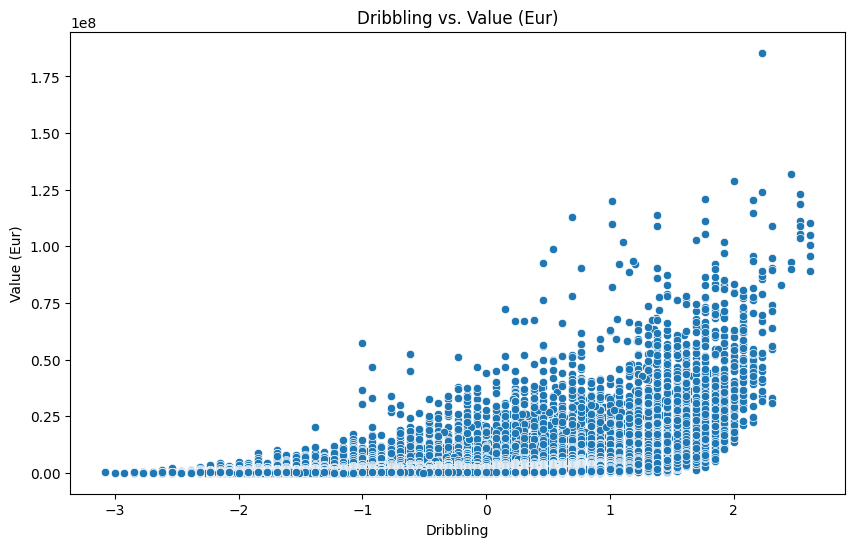

In [ ]:
# import
import matplotlib.pyplot as plt
import seaborn as sns

# create plot pace vs value scaled
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_scaled, x='dribbling', y='value_eur')

# add title and labels
plt.title('Dribbling vs. Value (Eur)')
plt.ylabel('Value (Eur)')
plt.xlabel('Dribbling')

# show
plt.show()

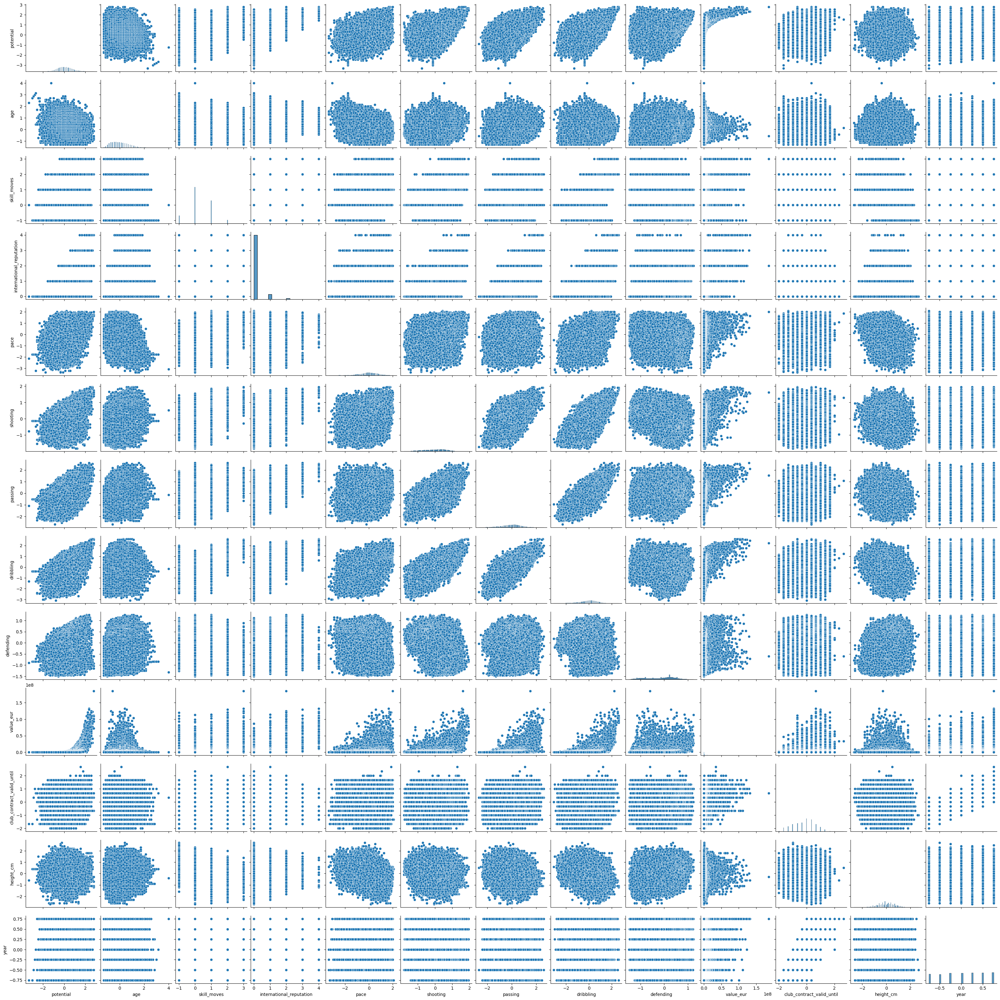

In [ ]:
# import
import seaborn as sns

# create pairplot with scaled data
scaled_pairplot = sns.pairplot(df_scaled[["potential",
                                          "age",
                                          "skill_moves",
                                          "international_reputation",
                                          "pace",
                                          "shooting",
                                          "passing",
                                          "dribbling",
                                          "defending",
                                          "value_eur",
                                          "club_contract_valid_until",
                                          "height_cm",
                                          "year"]],
                               diag_kind= "hist")

## 1.3 Final Datasets

In [ ]:
# final dataset
df_scaled

,ID,potential,age,league_level,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,club_contract_valid_until,height_cm,year,value_eur
0,-0.999854,2.777778,0.285714,0.0,2.0,4.0,1.785714,1.761905,2.101449,2.615385,-1.035714,-0.666667,-1.2,-0.75,100500000.0
1,-0.999837,2.444444,0.571429,0.0,3.0,4.0,1.785714,1.952381,1.739130,2.230769,-0.857143,-0.666667,0.4,-0.75,79000000.0
2,-0.999821,2.222222,0.714286,0.0,2.0,4.0,1.785714,1.619048,1.884058,2.307692,-0.857143,-1.000000,-0.1,-0.75,54500000.0
3,-0.999805,2.222222,1.000000,0.0,2.0,4.0,0.571429,1.857143,1.739130,1.846154,-0.785714,-1.333333,1.4,-0.75,52500000.0
4,-0.999789,2.222222,0.428571,0.0,-1.0,4.0,0.142857,0.657143,1.521739,1.353846,0.478571,-0.333333,1.2,-0.75,63500000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121266,0.998503,-2.000000,-0.571429,0.0,0.0,0.0,-0.714286,-1.380952,-2.246377,-2.692308,-0.214286,0.000000,-0.4,0.75,70000.0
121267,0.998520,-1.888889,-0.571429,0.0,0.0,0.0,-0.714286,-0.952381,-0.579710,-1.153846,-0.464286,0.666667,-0.7,0.75,70000.0
121268,0.998536,-2.555556,0.428571,0.0,0.0,0.0,-0.214286,-0.714286,-0.579710,-1.230769,-0.571429,0.666667,0.4,0.75,45000.0
121269,0.998552,-0.333333,-1.142857,3.0,0.0,0.0,0.142857,-0.285714,-1.231884,-0.692308,-1.428571,0.333333,-1.0,0.75,130000.0


Nun teilen wir unsere skalierten Daten in einen Trainings- und einen Testsatz auf, damit wir mit dem Training der Modelle beginnen können. Der Trainingssatz besteht aus 70 % der Instanzen.

In [ ]:
# import
from sklearn.model_selection import train_test_split

# split into train and test
X = df_scaled.drop("value_eur", axis=1)
y = df_scaled["value_eur"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [ ]:
# print shapes
print("Original Set:", train.shape)
print("Train Set:", X_train.shape, y_train.shape)
print("Test Set:", X_test.shape, y_test.shape)

Original Set: (121271, 15)
Train Set: (84889, 14) (84889,)
Test Set: (36382, 14) (36382,)


#2 Build Models

In diesem Abschnitt werden wir die folgenden Modelle verwenden, um
um den Marktwert vorherzusagen:


*   Linear Regression
*   Gradient Boosting
*   Random Forest
*   Neural Network
*   Stacking





## 2.1 Visualization Functions

Um die Ergebnisse der Modelle besser beurteilen zu können, definieren wir zwei Funktionen, die uns bei der Suche nach den richtigen Hyperparametern während des Optimierungsprozesses helfen werden.


*   Actual vs Predicted
*   Variable Importance



In [ ]:
# source: Module 04 TreesForestsEnsemblesStacking.ipynb

### function to plot the actual value to the predicted value ###
def actual_vs_predicted_plot(y_true, y_pred):

  # import
  import numpy as np
  import matplotlib.pyplot as plt

  # min max values for plot scaling
  min_value=np.array([y_true.min(), y_pred.min()]).min()
  max_value=np.array([y_true.max(), y_pred.max()]).max()

  # scatter plot
  fig, ax = plt.subplots(figsize=(10,5))
  ax.scatter(y_true,y_pred, color="blue")
  ax.plot([min_value,max_value], [min_value, max_value], lw=4, color="green")

  # add titles and labels
  ax.set_title("Actual vs Predicted Plot")
  ax.set_xlabel('Actual')
  ax.set_ylabel('Predicted')

  # show
  plt.show()

In [ ]:
# source: Module 02 LinearRegression.ipynb

### function to plot variable importance ###
def plot_variable_importance(model, X_train):

    # import
    import matplotlib.pyplot as plt
    from pandas import DataFrame

    # sort feature importances and create a dataframe
    imp=DataFrame({"imp":model.feature_importances_, "names":X_train.columns}).sort_values("imp", ascending=True)

    # create plot
    fig, ax = plt.subplots(figsize=(imp.shape[0]/6,imp.shape[0]/5), dpi=100)

    # create horizontal bar plot with names and importance
    ax.barh(imp["names"],imp["imp"], color="orange")

    # set labels and title
    ax.set_xlabel('\nVariable Importance')
    ax.set_ylabel('Features\n')
    ax.set_title('Variable Importance Plot\n')

    # show
    plt.show()

##2.2 Linear Regression

Wir beginnen mit einer linearen Regression, da diese sehr einfach zu implementieren ist. Wir können davon ausgehen, dass dieses Modell nicht sehr gut funktioniert, da wir im Paarplot gesehen haben, dass die meisten Beziehungen nicht wirklich linear sind.

### Train Model

In [ ]:
# import
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score,roc_auc_score, confusion_matrix, accuracy_score, roc_curve
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

# instantiate model
model_linreg  = sm.OLS(y_train, sm.add_constant(X_train))

# fit model
linreg = model_linreg.fit()

# predict on test and train
y_test_pred_linreg = linreg.predict(sm.add_constant(X_test))
y_train_pred_linreg = linreg.predict(sm.add_constant(X_train))


### Evaluate Model

In [ ]:
# summary
print(linreg.summary())

                            OLS Regression Results                            
Dep. Variable:              value_eur   R-squared:                       0.524
Model:                            OLS   Adj. R-squared:                  0.524
Method:                 Least Squares   F-statistic:                     6670.
Date:                Mon, 27 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:01:16   Log-Likelihood:            -1.4052e+06
No. Observations:               84889   AIC:                         2.810e+06
Df Residuals:                   84874   BIC:                         2.811e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [ ]:
# import
from sklearn.metrics import mean_squared_error, r2_score

# calculate mse, rmse and r2
mse_train_linreg = mean_squared_error(y_train, y_train_pred_linreg)
mse_test_linreg = mean_squared_error(y_test, y_test_pred_linreg)

rmse_train_linreg = mean_squared_error(y_train, y_train_pred_linreg, squared = False)
rmse_test_linreg = mean_squared_error(y_test, y_test_pred_linreg, squared = False)

r2_train_linreg = r2_score(y_train, y_train_pred_linreg)
r2_test_linreg = r2_score(y_test, y_test_pred_linreg)

# print results
print(f'Train MSE: {mse_train_linreg}')
print(f'Test MSE: {mse_test_linreg}\n')

print(f'Train RMSE: {rmse_train_linreg}')
print(f'Test RMSE: {rmse_test_linreg}\n')

print(f'Train R-squared: {r2_train_linreg}')
print(f'Test R-squared: {r2_test_linreg}')

Train MSE: 13986228917075.42
Test MSE: 14170960189275.23

Train RMSE: 3739816.6956517296
Test RMSE: 3764433.581466836

Train R-squared: 0.5238539308375737
Test R-squared: 0.5190293553144896


Der RMSE ist sehr hoch und das Modell ist daher sehr ungenau. Der R-Quadrat-Wert liegt bei etwa 0.5. Wir können sehen, dass die meisten unserer Merkmale statistisch signifikant sind, da ihr p-Wert unter 0.05 liegt.

Im folgenden Streudiagramm können wir visuell erkennen, dass unser Modell sehr schlecht abschneidet, da die blauen Punkte sehr weit von der Diagonale entfernt sind.

Zusammenfassend lässt sich sagen, dass die lineare Regression kein geeignetes Modell für diese Aufgabe ist, da sie die Realität zu sehr vereinfacht, indem sie eine lineare Beziehung annimmt.

Source:
https://www.geeksforgeeks.org/ml-advantages-and-disadvantages-of-linear-regression/

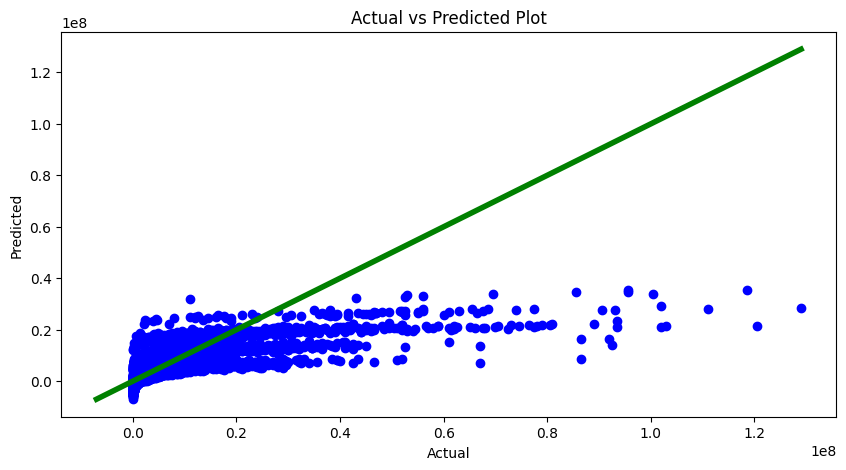

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_linreg)

## 2.3 Gradient Boosting

Als Nächstes versuchen wir es mit Gradient Boosting. Gradient Boosting ist eine Ensemble-Methode, bei der nacheinander Entscheidungsbäume hinzugefügt werden. Die neuen Bäume werden so angepasst, dass sie den Fehler des vorherigen Baumes "korrigieren". Eine Verlustfunktion wird durch gradient descent optimiert, um ein optimales Modell zu erstellen.

Ein Problem beim Gradient Boosting ist, dass es bei komplexen Modellen und bei einer hohen learning rate leicht zum Overfitting kommen kann. Ausserdem ist es sehr rechenintensiv.

Source:
https://medium.com/@datasciencewizards/understanding-the-gradient-boosting-algorithm-9fe698a352ad

### Train Model

In [ ]:
# import
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Gradient Boosting Regressor
model_gbr = GradientBoostingRegressor(random_state = 42)

# fit on train
gbr = model_gbr.fit(X_train, y_train)

# predict on test and train
y_test_pred_gbr = gbr.predict(X_test)
y_train_pred_gbr = gbr.predict(X_train)

### Evaluate Model

In [ ]:
# calculate rmse for train and test
rmse_train_gbr = mean_squared_error(y_train, y_train_pred_gbr, squared = False)
rmse_test_gbr = mean_squared_error(y_test, y_test_pred_gbr, squared = False)

# print results
print(f'Gradient Boosting:\n')
print(f'Train RMSE: {rmse_train_gbr}')
print(f'Test RMSE: {rmse_test_gbr}')

Gradient Boosting:

Train RMSE: 976833.4076920039
Test RMSE: 1036501.8751114601


Der RMSE ist deutlich besser als der RMSE der linearen Regression. Dies ist auch am scatter plot zu erkennen, da die blauen Punkte fast auf der Diagonalen liegen. Der Variable Importance Plot zeigt uns, dass vor allem das Potenzial des Spielers für den Marktwert entscheidend ist. Darüber hinaus sind auch das Alter und die Dribbelstärke sehr wichtig für ein gutes Modell.

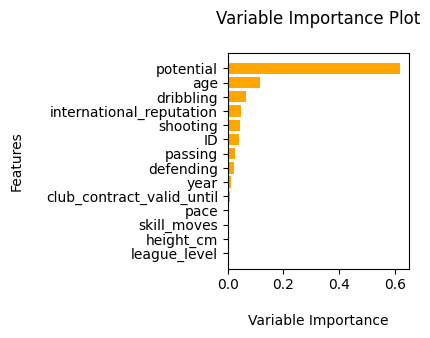

In [ ]:
# plot vairable importance
plot_variable_importance(gbr, X_train)

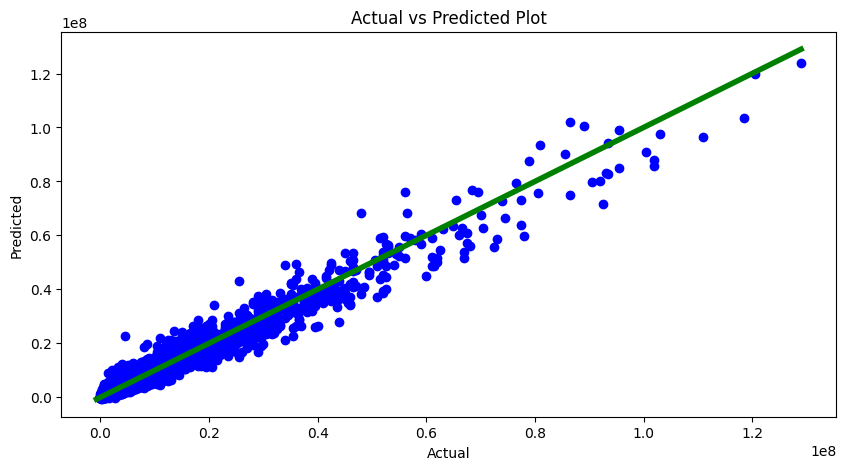

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_gbr)

Schauen wir uns an, wie sich das Ergebnis ändert, wenn wir Cross Validation durchführen. So können wir besser abschätzen, wie unser Modell bei unseen Data abschneiden wird.

In [ ]:
# import
from sklearn.model_selection import cross_val_score

# cross validation
scores = cross_val_score(model_gbr, X, y, cv=5, scoring='neg_mean_squared_error')

In [ ]:
# rmse for each fold
rmse_scores_gbr = np.sqrt(-scores)

# list of rmse and mean of all rmse
print(f'RMSE scores for each fold:\n\n', rmse_scores_gbr)
print(f'\nMean RMSE:', rmse_scores_gbr.mean())

RMSE scores for each fold:

 [1485881.6506686   764361.65128771 1555033.15556036 1004334.43590836
 3042176.34109471]

Mean RMSE: 1570357.4469039459


Bei etwa +500'000 ist der RMSE bei der Cross Validation deutlich schlechter. Dementsprechend wird unser Modell bei ungesehenen Daten wohl deutlich schlechter abschneiden. Dies könnte ein Hinweis auf die bereits erwähnte Anfälligkeit des Gradient Boosting für Overfitting sein. Im Folgenden versuchen wir, die Hyperparameter so zu verändern, dass wir nach der Cross Validation einen höheren RMSE haben.

### Hyperparameter Tuning

Um die erforderliche Rechenleistung zu reduzieren, verwenden wir nur 50% des Datensatzes. Wir hoffen, die sehr langen Berechnungszeiten zu reduzieren und trotzdem ein zuverlässiges Ergebnis zu erhalten.

In [ ]:
# import
from sklearn.model_selection import train_test_split

# create subset with a fraction of 50%
df_scaled_subset = df_scaled.sample(frac=0.5, random_state=42)

# split subset into train and test
X_subset = df_scaled_subset.drop("value_eur", axis=1)
y_subset = df_scaled_subset["value_eur"]

X_train_subset, X_test_subset, y_train_subset, y_test_subset = train_test_split(X_subset, y_subset, test_size=0.3, random_state = 42)

In [ ]:
# print shapes
print("Original Set:", train.shape)
print()
print("Train Set:", X_train.shape, y_train.shape)
print("Test Set:", X_test.shape, y_test.shape)
print()
print("Train Subset:", X_train_subset.shape, y_train_subset.shape)
print("Test Subset:", X_test_subset.shape, y_test_subset.shape)

Original Set: (121271, 15)

Train Set: (84889, 14) (84889,)
Test Set: (36382, 14) (36382,)

Train Subset: (42445, 14) (42445,)
Test Subset: (18191, 14) (18191,)


Nun wenden wir GridSearchCV an, um die optimalen Hyperparameter zu finden:

In [ ]:
#import
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# define parameters to test
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2],
}

# Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# GridSearchCV
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# fit to subset train
grid_search.fit(X_train_subset, y_train_subset)

# get and print best parameters
best_params = grid_search.best_params_
print(f'Best parameters: {best_params}')

Best parameters: {'learning_rate': 0.2, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


Setzen wir die Parameter in unser Modell ein:

In [ ]:
# import
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Gradient Boosting Regressor
model_gbr_opt = GradientBoostingRegressor(random_state = 42,
                                          learning_rate = 0.2,
                                          max_depth = 4,
                                          min_samples_leaf = 1,
                                          min_samples_split = 2,
                                          n_estimators = 200)


# fit on train
gbr_opt = model_gbr_opt.fit(X_train, y_train)

# predict on test and train
y_test_pred_gbr_opt = gbr_opt.predict(X_test)
y_train_pred_gbr_opt = gbr_opt.predict(X_train)

In [ ]:
# calculate rmse for test and train
rmse_train_gbr_opt = mean_squared_error(y_train, y_train_pred_gbr_opt, squared = False)
rmse_test_gbr_opt = mean_squared_error(y_test, y_test_pred_gbr_opt, squared = False)

# print results
print(f'Gradient Boosting Optimized:\n')
print(f'Train RMSE: {rmse_train_gbr_opt}')
print(f'Test RMSE: {rmse_test_gbr_opt}')

Gradient Boosting Optimized:

Train RMSE: 565509.7783019162
Test RMSE: 807501.1490949802


Das Modell schneidet mit den optimierten Parametern deutlich besser ab. Im Variable Importance Plot ist zu erkennen, dass das Potenzial des Spielers immer noch ausschlaggebend ist, aber die Schussfähigkeit des Spielers eine wichtigere Rolle spielt als zuvor.

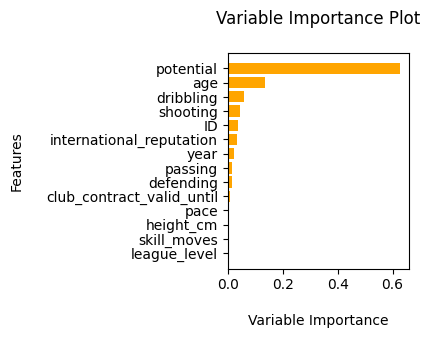

In [ ]:
# plot variable importance
plot_variable_importance(gbr_opt, X_train)

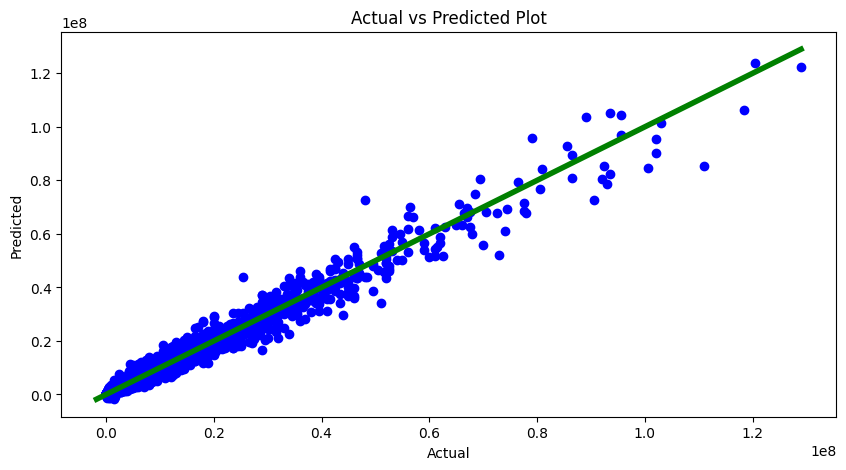

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_gbr_opt)

In [ ]:
# import
from sklearn.model_selection import cross_val_score

#  cross validation
scores_gbr_opt = cross_val_score(model_gbr_opt, X, y, cv=5, scoring='neg_mean_squared_error')

In [ ]:
# calculate rmse for each fold
rmse_scores_gbr_opt = np.sqrt(-scores_gbr_opt)

# results
print(f'RMSE scores for each fold:\n\n', rmse_scores_gbr_opt)
print(f'\nMean RMSE:', rmse_scores_gbr_opt.mean())

RMSE scores for each fold:

 [1382019.05418527  636100.00728145 1460930.64839668  865373.30528434
 3826571.06928292]

Mean RMSE: 1634198.816886132


In [ ]:
# print rmse base and optimized model
print(f'\nMean RMSE Base Model:', rmse_scores_gbr.mean())
print(f'\nMean RMSE Opt. Model:', rmse_scores_gbr_opt.mean())


Mean RMSE Base Model: 1570357.4469039459

Mean RMSE Opt. Model: 1634198.816886132


Der RMSE erhöhte sich während der Cross Validation des optimierten Modells. Es wäre zu erwarten gewesen, dass er sinkt. In den Berechnungen ist zu erkennen, dass vor allem der letzte Fold einen sehr hohen RMSE von 3'826'571 aufweist und somit einen starken Einfluss auf den durchschnittlichen RMSE hatte.

## 2.4 Random Forest

Ein Random-Forest-Modell besteht aus mehreren Entscheidungsbäumen. Das Ensemble aus mehreren Bäumen macht den Algorithmus genauer als die einzelnen Entscheidungsbäume. Um mit dem Modell zu beginnen, setzen wir die Anzahl der Bäume in unserem Forest auf n_estimators = 100.


Source:
https://www.ibm.com/topics/random-forest

### Train Model

In [ ]:
# import
from sklearn.ensemble import RandomForestRegressor

# instantiate RandomForestRegressor
model_random  = RandomForestRegressor(n_estimators=100, random_state = 42)

# fit model
randomforest = model_random.fit(X_train,y_train)

# predict on test and train
y_test_pred_random = randomforest.predict(X_test)
y_train_pred_random = randomforest.predict(X_train)

### Evaluate Model

In [ ]:
# calculate rmse
rmse_train_random = mean_squared_error(y_train, y_train_pred_random, squared = False)
rmse_test_random = mean_squared_error(y_test, y_test_pred_random, squared = False)

# print result
print(f'Random Forest:\n')
print(f'Train RMSE: {rmse_train_random}')
print(f'Test RMSE: {rmse_test_random}')

Random Forest:

Train RMSE: 362845.9719412893
Test RMSE: 868665.432064338


Mit einem RMSE Wert von ca. 870'000 ist das Random Forest Modell etwas schlechter als das Optimized Gradient Boosting Modell mit einem RMSE von ca. 810'000. Auffällig ist der grosse Unterschied zwischen dem Train RMSE und dem Test RMSE, was auf Overfitting hinweisen könnte. Das Modell generalisiert sehr schlecht. Wir werden versuchen, das Problem des Overfittings durch Tuning der Hyperparameter zu lösen.



Der Variable Importance Plot zeigt, dass die Variable international_reputation an Bedeutung gewonnen hat.
Die Vorhersagepunkte auf dem scatter plot unten liegen ungefähr auf der grünen Linie.


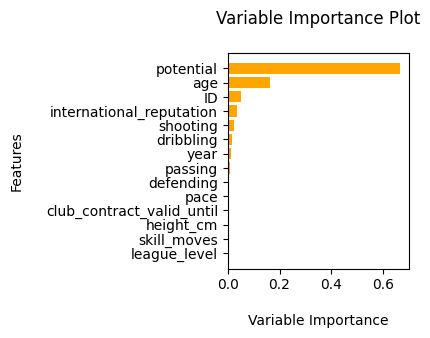

In [ ]:
# plot variable importance
plot_variable_importance(randomforest, X_train)

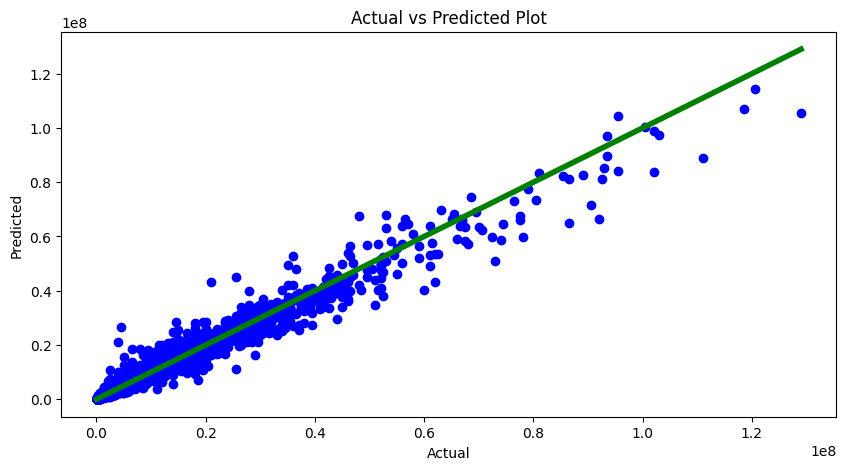

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_random)

In [ ]:
# import
from sklearn.model_selection import cross_val_score

# cross validation
scores_random = cross_val_score(model_random, X, y, cv=5, scoring='neg_mean_squared_error')

In [ ]:
# calculate rmse for each fold
rmse_scores_random = np.sqrt(-scores_random)

# print result
print(f'RMSE scores for each fold:\n\n', rmse_scores_random)
print(f'\nMean RMSE:', rmse_scores_random.mean())

RMSE scores for each fold:

 [1561974.87187831  841393.2774236  1676445.88835668 1134688.34519611
 3152745.27939089]

Mean RMSE: 1673449.5324491176


Die RMSE-Werte für die einzelnen Faltungen sind recht groß und zeigen eine starke Streuung (ca. 840.000 - 1.680.000). Dies bekräftig unsere Vermutung, dass das Modell ein Overfitting-Problem hat, also schlecht verallgemeinert.

### Hyperparameter Tuning

Nun wenden wir GridSearchCV an, um die optimalen Hyperparameter zu finden und Overfitting zu verhindern.

In [ ]:
# import
from sklearn.model_selection import GridSearchCV

# define parameters to test
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2],
}
# Gradient Boosting Regressor
random = RandomForestRegressor(random_state=42)

# GridSearchCV
grid_search = GridSearchCV(estimator=random, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# fit to subset train data
grid_search.fit(X_train_subset, y_train_subset)

# get and print best parameters
best_params = grid_search.best_params_
print(f'Best parameters: {best_params}')

Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}


Setzen wir die Parameter ins Modell ein:

In [ ]:
# import
from sklearn.ensemble import RandomForestRegressor

# instantiate model with best parameters
model_random_opt  = RandomForestRegressor(n_estimators = 150,
                                      max_depth = 10,
                                      min_samples_leaf = 1,
                                      min_samples_split = 2,
                                      random_state = 42)

# fit model on train
randomforest_opt = model_random_opt.fit(X_train,y_train)

# predict on test and train
y_test_pred_random_opt = randomforest_opt.predict(X_test)
y_train_pred_random_opt = randomforest_opt.predict(X_train)

In [ ]:
# calculate rmse
rmse_train_random_opt = mean_squared_error(y_train, y_train_pred_random_opt, squared = False)
rmse_test_random_opt = mean_squared_error(y_test, y_test_pred_random_opt, squared = False)

# print results
print(f'Random Forest Optimized:\n')
print(f'Train RMSE: {rmse_train_random_opt}')
print(f'Test RMSE: {rmse_test_random_opt}')

Random Forest Optimized:

Train RMSE: 712901.0820776598
Test RMSE: 1004464.4235185721



Mit dem optimierten Modell sind sowohl der RMSE auf dem Train (ca. 710'000 vs. 360'000) als auch der RMSE auf dem Testset (ca. 1'000'000 vs. 870'000) höher, aber die Diskrepanz zwischen den Train und Test RMSE Werten ist deutlich geringer.

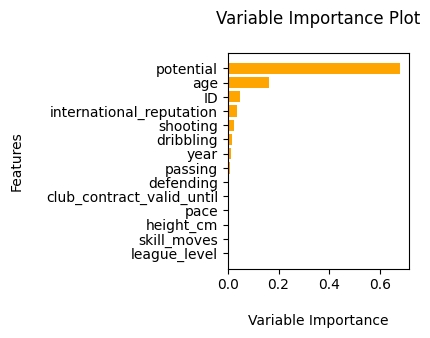

In [ ]:
# plot variable importance
plot_variable_importance(randomforest_opt, X_train)

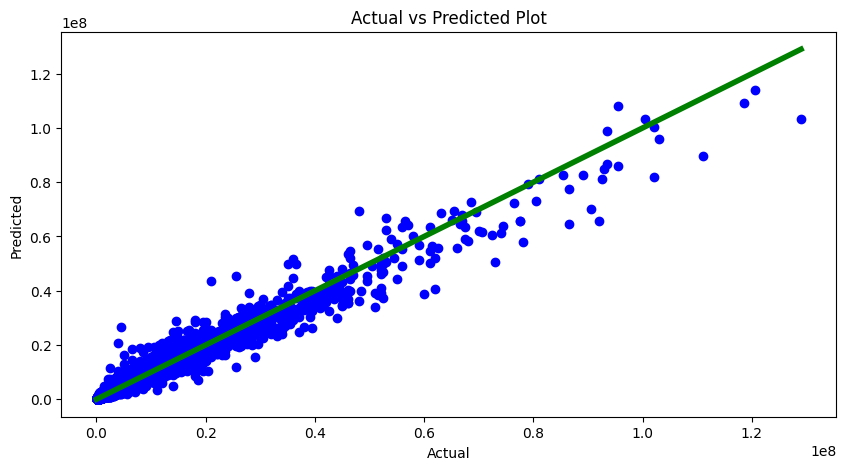

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_random_opt)

In [ ]:
# import
from sklearn.model_selection import cross_val_score

# cross validation
scores_random_opt = cross_val_score(model_random_opt, X, y, cv=5, scoring='neg_mean_squared_error')

In [ ]:
# calculate rmse for each fold
rmse_scores_random_opt = np.sqrt(-scores_random_opt)

# print results
print(f'RMSE scores for each fold:\n\n', rmse_scores_random_opt)
print(f'\nMean RMSE:', rmse_scores_random_opt.mean())

RMSE scores for each fold:

 [1541243.36560138  766818.97371976 1635578.10232285 1155706.38316263
 3153679.48144679]

Mean RMSE: 1650605.2612506803


In [ ]:
# print base and optimized model rmse
print(f'\nMean RMSE Base Model:', rmse_scores_random.mean())
print(f'\nMean RMSE Opt. Model:', rmse_scores_random_opt.mean())


Mean RMSE Base Model: 1673449.5324491176

Mean RMSE Opt. Model: 1650605.2612506803


Trotz des höheren RMSE ohne Cross Validation  verbesserte sich der mittlere RMSE mit Cross Validation leicht im Vergleich zum nicht optimierten Modell. Wir konnten also das Overfitting leicht reduzieren.

Zusammenfassend lässt sich sagen, dass die Optimierung zwar zu einer leichten Verbesserung der Modellleistung geführt hat, die insgesamt hohen RMSE Werte jedoch darauf hindeuten, dass das Modell weiter verbessert werden kann. Versuchen wir es mit einem neuronalen Netz.

## 2.5 Tensorflow Neural Network

Zuerst werden wir ein neuronales Netzwerk mit Tensorflow erstellen und optimieren. Basierend auf den gewonnenen Erkenntnissen werden wir ein weiteres neuronales Netzwerk mit Sklearn erstellen. Dieses wird anfangs eine ähnliche Modellarchitektur wie das Tensorflow Modell haben. Danach wird GridSearchCV verwendet, um die optimalen Parameterwerte zu finden.

Wir beginnen mit einer Squential Klasse und vier Layers mit der ReLU-Activationfunction sowie 128, 64, 32 Neuronen und einer Ausgabeschicht mit einem Neuron. Das Modell verwendet den Adam-Optimierer und hat eine learning rate von 0,005. Der MSE dient als Verlustfunktion.

### Train Model

In [ ]:
# import
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error

# define neural network architecture
model_nn = Sequential()
model_nn.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model_nn.add(Dense(64, activation='relu'))
model_nn.add(Dense(32, activation='relu'))
model_nn.add(Dense(1))

# compile
model_nn.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error')

# fit on train
nn = model_nn.fit(X_train, y_train, epochs=50, batch_size=10)

# predict on test and train
y_test_pred_nn = model_nn.predict(X_test).flatten()
y_train_pred_nn = model_nn.predict(X_train).flatten()

Epoch 1/50
8489/8489 [==============================] - 24s 3ms/step - loss: 9691454242816.0000
Epoch 2/50
8489/8489 [==============================] - 23s 3ms/step - loss: 4757947678720.0000
Epoch 3/50
8489/8489 [==============================] - 23s 3ms/step - loss: 3652052058112.0000
Epoch 4/50
8489/8489 [==============================] - 21s 2ms/step - loss: 3241388015616.0000
Epoch 5/50
8489/8489 [==============================] - 33s 4ms/step - loss: 3113183084544.0000
Epoch 6/50
8489/8489 [==============================] - 28s 3ms/step - loss: 2897470816256.0000
Epoch 7/50
8489/8489 [==============================] - 24s 3ms/step - loss: 2757808357376.0000
Epoch 8/50
8489/8489 [==============================] - 23s 3ms/step - loss: 2683143192576.0000
Epoch 9/50
8489/8489 [==============================] - 27s 3ms/step - loss: 2610814255104.0000
Epoch 10/50
8489/8489 [==============================] - 26s 3ms/step - loss: 2490887307264.0000
Epoch 11/50
8489/8489 [================

###Evaluate Model

In [ ]:
# calculate rmse
rmse_train_nn = mean_squared_error(y_train, y_train_pred_nn, squared = False)
rmse_test_nn = mean_squared_error(y_test, y_test_pred_nn, squared = False)

# print results
print(f'Neural Network Tensorflow:\n')
print(f'Train RMSE: {rmse_train_nn}')
print(f'Test RMSE: {rmse_test_nn}')

Neural Network Tensorflow:

Train RMSE: 1406297.7377640817
Test RMSE: 1421370.0181220016


Beide RMSEs sind sehr hoch. Die Streuung der Punkte im scatter plot, insbesondere bei höheren Werten, zeigt, dass die Vorhersagen des Modells nicht perfekt mit den tatsächlichen Werten übereinstimmen. Der stark abnehmende Loss über die Epochen hinweg weist darauf hin, dass das Modell etwas gelernt hat, insbesondere in den ersten Epochen. Danach bleibt er auf einem konstanten Niveau, was darauf hindeutet, dass weitere Epochen die Genauigkeit des Modells nicht verbessern werden.

Insgesamt kann man also sagen, dass das neuronale Netzwerk bis zu einem gewissen Grad gelernt hat. Die hohen RMSE-Werte zeigen jedoch, dass es die Komplexität des Datensatzes nicht effektiv erfasst hat. Im nächsten Anschnitt werden wir versuchen, das Modell weiter zu optimieren.

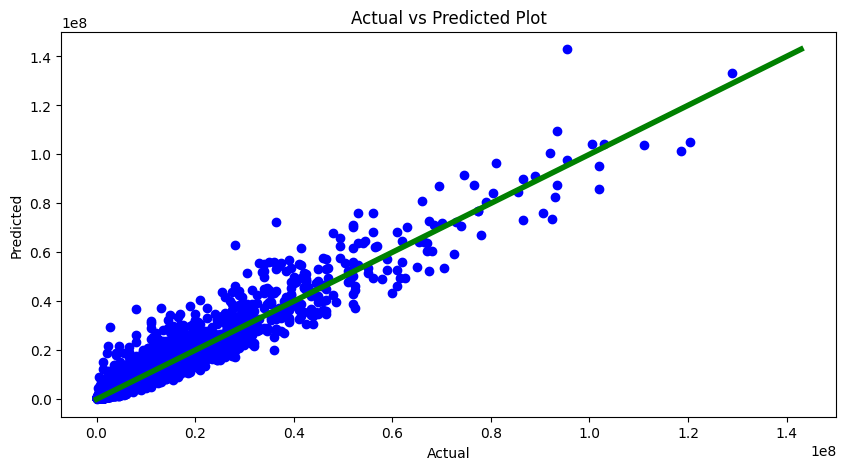

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_nn)

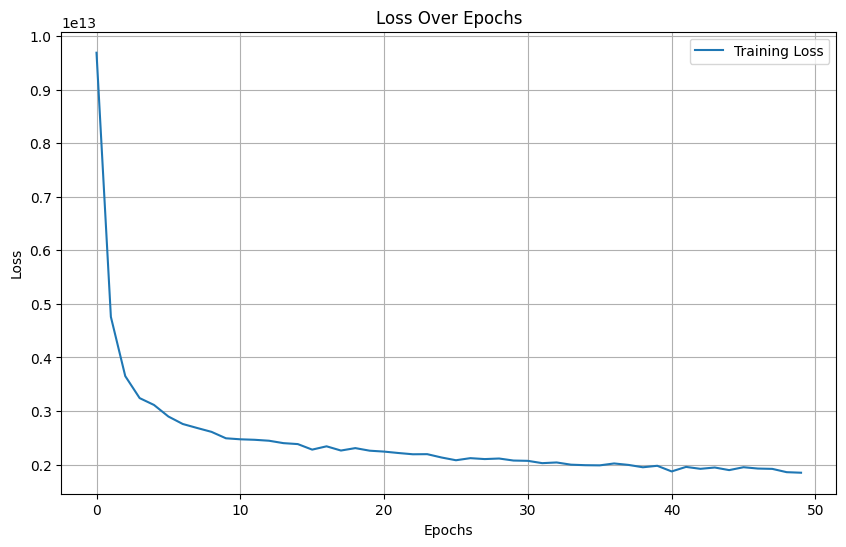

In [ ]:
# import
import matplotlib.pyplot as plt

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(nn.history['loss'], label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

### Hyperparameter Tuning

#### Optimized Model 1
Wir fügen zwei weitere Layer zu unserer Architektur hinzu und erhöhen die Lernrate von 0.005 auf 0.01. Die Batch size ist nun mit 64 deutlich höher als zuvor. Um den Prozess zu beschleunigen, reduzieren wir auch die Anzahl der Epochen auf 15.

In [ ]:
# define neural network architecture
model_nn_opt1 = Sequential()
model_nn_opt1.add(Dense(512, activation='relu', input_shape=(X_train.shape[1],)))
model_nn_opt1.add(Dense(256, activation='relu'))
model_nn_opt1.add(Dense(128, activation='relu'))
model_nn_opt1.add(Dense(64, activation='relu'))
model_nn_opt1.add(Dense(32, activation='relu'))
model_nn_opt1.add(Dense(1))

# compile
model_nn_opt1.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')

# fit on train
nn_opt1 = model_nn_opt1.fit(X_train, y_train, epochs=15, batch_size=64, verbose=1)

# predict on test and train
y_test_pred_nn_opt1 = model_nn_opt1.predict(X_test).flatten()
y_train_pred_nn_opt1 = model_nn_opt1.predict(X_train).flatten()

Epoch 1/15
1327/1327 [==============================] - 12s 8ms/step - loss: 6221960052736.0000
Epoch 2/15
1327/1327 [==============================] - 12s 9ms/step - loss: 4157567139840.0000
Epoch 3/15
1327/1327 [==============================] - 9s 7ms/step - loss: 4046966751232.0000
Epoch 4/15
1327/1327 [==============================] - 12s 9ms/step - loss: 3164720857088.0000
Epoch 5/15
1327/1327 [==============================] - 11s 8ms/step - loss: 2582366650368.0000
Epoch 6/15
1327/1327 [==============================] - 10s 7ms/step - loss: 2321517379584.0000
Epoch 7/15
1327/1327 [==============================] - 12s 9ms/step - loss: 2037441757184.0000
Epoch 8/15
1327/1327 [==============================] - 9s 7ms/step - loss: 1711115337728.0000
Epoch 9/15
1327/1327 [==============================] - 12s 9ms/step - loss: 1924045733888.0000
Epoch 10/15
1327/1327 [==============================] - 10s 8ms/step - loss: 1658403946496.0000
Epoch 11/15
1327/1327 [==================

In [ ]:
# calculate rmse
rmse_train_nn_opt1 = mean_squared_error(y_train, y_train_pred_nn_opt1, squared = False)
rmse_test_nn_opt1 = mean_squared_error(y_test, y_test_pred_nn_opt1, squared = False)

# print results
print(f'Neural Network Tensorflow Optimized 1:\n')
print(f'Train RMSE: {rmse_train_nn_opt1}')
print(f'Test RMSE: {rmse_test_nn_opt1}')

Neural Network Tensorflow Optimized 1:

Train RMSE: 1000870.60277126
Test RMSE: 1009154.6437770573


Der RMSE hat sich verbessert und es gibt fast keinen Unterschied mehr zwischen dem Train RMSE und dem Test RMSE. Unten sehen wir, dass die Loss Curve nicht mehr konstant abnimmt, sondern z.B. bei Epoche 10 abrupt ansteigt. Dies könnte darauf hindeuten, dass die learning rate zu hoch ist. Um dies zu bestätigen, erhöhen wir sie im nächsten Modell weiter.

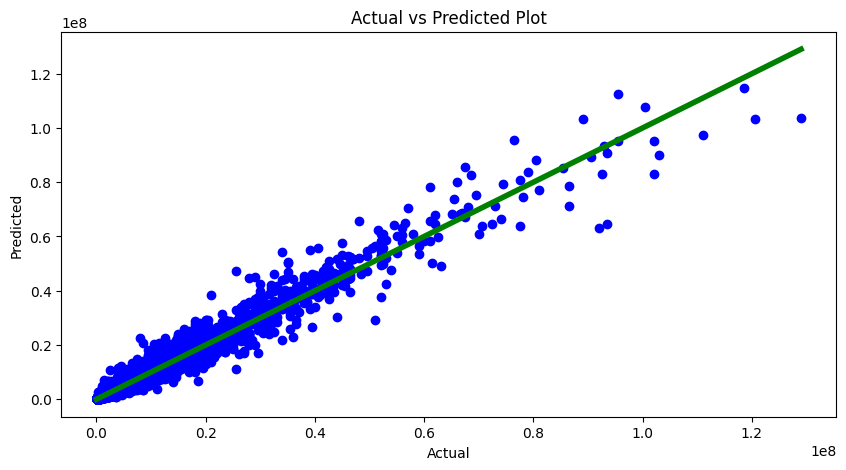

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_nn_opt1)

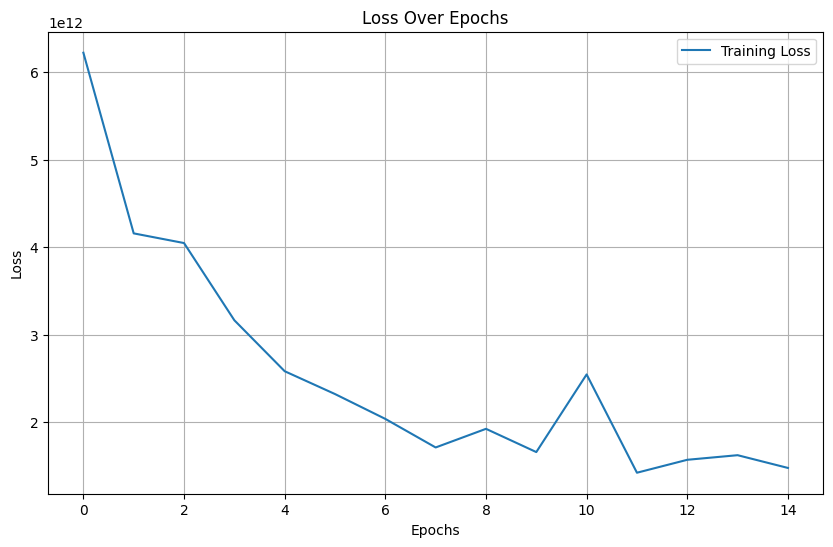

In [ ]:
#import
import matplotlib.pyplot as plt

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(nn_opt1.history['loss'], label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

#### Optimized Model 2

Wir erhöhen die learning rate auf 0.1 von 0.01. Zudem erhöhen wir die Anzahl Epochen auf 20, um zu schauen, ob das Modell noch weiter lernen kann.

In [ ]:
# import
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error

# define  neural network architecture
model_nn_opt2 = Sequential()
model_nn_opt2.add(Dense(512, activation='relu', input_shape=(X_train.shape[1],)))
model_nn_opt2.add(Dense(256, activation='relu'))
model_nn_opt2.add(Dense(128, activation='relu'))
model_nn_opt2.add(Dense(64, activation='relu'))
model_nn_opt2.add(Dense(32, activation='relu'))
model_nn_opt2.add(Dense(1))

# compile
model_nn_opt2.compile(optimizer=Adam(learning_rate=0.1), loss='mean_squared_error')

# fit on train
nn_opt2 = model_nn_opt2.fit(X_train, y_train, epochs=20, batch_size=64, verbose=1)

# predict on train and test
y_test_pred_nn_opt2 = model_nn_opt2.predict(X_test).flatten()
y_train_pred_nn_opt2 = model_nn_opt2.predict(X_train).flatten()

Epoch 1/20
1327/1327 [==============================] - 11s 7ms/step - loss: 7929665159168.0000
Epoch 2/20
1327/1327 [==============================] - 13s 10ms/step - loss: 4344483414016.0000
Epoch 3/20
1327/1327 [==============================] - 12s 9ms/step - loss: 3435305107456.0000
Epoch 4/20
1327/1327 [==============================] - 9s 7ms/step - loss: 3596708741120.0000
Epoch 5/20
1327/1327 [==============================] - 11s 9ms/step - loss: 3864482021376.0000
Epoch 6/20
1327/1327 [==============================] - 11s 8ms/step - loss: 3602517852160.0000
Epoch 7/20
1327/1327 [==============================] - 10s 7ms/step - loss: 3060637106176.0000
Epoch 8/20
1327/1327 [==============================] - 12s 9ms/step - loss: 3478699638784.0000
Epoch 9/20
1327/1327 [==============================] - 9s 7ms/step - loss: 3262030020608.0000
Epoch 10/20
1327/1327 [==============================] - 12s 9ms/step - loss: 2838569943040.0000
Epoch 11/20
1327/1327 [=================

In [ ]:
# calculate rmse
rmse_train_nn_opt2 = mean_squared_error(y_train, y_train_pred_nn_opt2, squared = False)
rmse_test_nn_opt2 = mean_squared_error(y_test, y_test_pred_nn_opt2, squared = False)

# print results
print(f'Neural Network Tensorflow Optimized 2:\n')
print(f'Train RMSE: {rmse_train_nn_opt2}')
print(f'Test RMSE: {rmse_test_nn_opt2}')

Neural Network Tensorflow Optimized 2:

Train RMSE: 1985872.1444085098
Test RMSE: 1988318.4441087812


Das Modell hat nun einen deutlich schlechteren RMSE (ca. +990'000). Der scatter plot unten zeigt ebenfalls, dass das Modell schlecht abschneidet. Wie oben angenommen, hat die höhere learning rate die Loss Curve noch holpriger gemacht. Darüber hinaus steigt der Verlust am Ende der Epochen stark an.

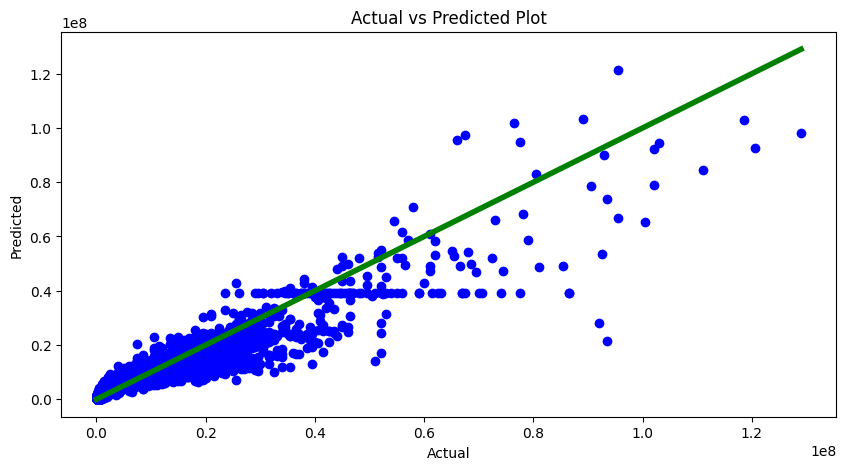

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_nn_opt2)

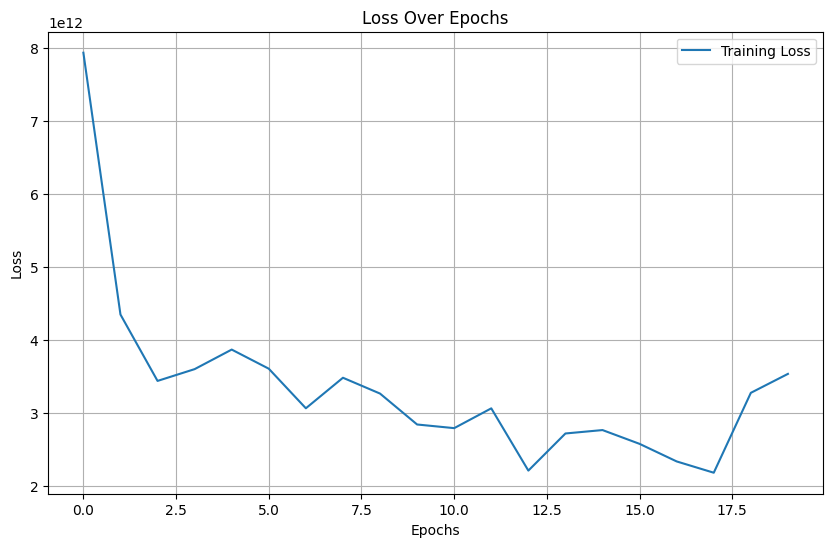

In [ ]:
# import
import matplotlib.pyplot as plt

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(nn_opt2.history['loss'], label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

#### Optimized Model 3
Aufgrund der gewonnen Erkenntnisse setzen wir die learning rate wieder zurück auf 0.005 und erhöhen die Anzahl Epochen um 5 auf epochs = 20.

In [ ]:
# import
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error

# define neural network architecture
model_nn_opt3 = Sequential()
model_nn_opt3.add(Dense(512, activation='relu', input_shape=(X_train.shape[1],)))
model_nn_opt3.add(Dense(256, activation='relu'))
model_nn_opt3.add(Dense(128, activation='relu'))
model_nn_opt3.add(Dense(64, activation='relu'))
model_nn_opt3.add(Dense(32, activation='relu'))
model_nn_opt3.add(Dense(1))

# compile
model_nn_opt3.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error')

# fit model on train
nn_opt3 = model_nn_opt3.fit(X_train, y_train, epochs=25, batch_size=64, verbose=1)

# predict on test and train
y_test_pred_nn_opt3 = model_nn_opt3.predict(X_test).flatten()
y_train_pred_nn_opt3 = model_nn_opt3.predict(X_train).flatten()

Epoch 1/25
1327/1327 [==============================] - 13s 9ms/step - loss: 7197049749504.0000
Epoch 2/25
1327/1327 [==============================] - 10s 8ms/step - loss: 3805185310720.0000
Epoch 3/25
1327/1327 [==============================] - 10s 7ms/step - loss: 3455843565568.0000
Epoch 4/25
1327/1327 [==============================] - 12s 9ms/step - loss: 3106619785216.0000
Epoch 5/25
1327/1327 [==============================] - 9s 7ms/step - loss: 3055489908736.0000
Epoch 6/25
1327/1327 [==============================] - 13s 10ms/step - loss: 3077358485504.0000
Epoch 7/25
1327/1327 [==============================] - 19s 15ms/step - loss: 2981431607296.0000
Epoch 8/25
1327/1327 [==============================] - 19s 14ms/step - loss: 2710417440768.0000
Epoch 9/25
1327/1327 [==============================] - 15s 12ms/step - loss: 2053607129088.0000
Epoch 10/25
1327/1327 [==============================] - 16s 12ms/step - loss: 1910602858496.0000
Epoch 11/25
1327/1327 [============

In [ ]:
# calculate rmse
rmse_train_nn_opt3 = mean_squared_error(y_train, y_train_pred_nn_opt3, squared = False)
rmse_test_nn_opt3 = mean_squared_error(y_test, y_test_pred_nn_opt3, squared = False)

# print results
print(f'Neural Network Tensorflow Optimized 3:\n')
print(f'Train RMSE: {rmse_train_nn_opt3}')
print(f'Test RMSE: {rmse_test_nn_opt3}')

Neural Network Tensorflow Optimized 3:

Train RMSE: 883223.8061461978
Test RMSE: 918020.271141441


 Durch die Optimierung der Parameter konnten wir den niedrigsten RMSE aller vier Tensorflow Neural Network Modelle erreichen. Die Loss Curve hat sich verbessert und es gibt keinen abrupten starken Anstieg mehr. Der scatter plot zeigt auch, dass die blauen Punkte ungefähr auf der grünen Linie liegen. Trotzdem ist das Modell nicht wirklich gut.

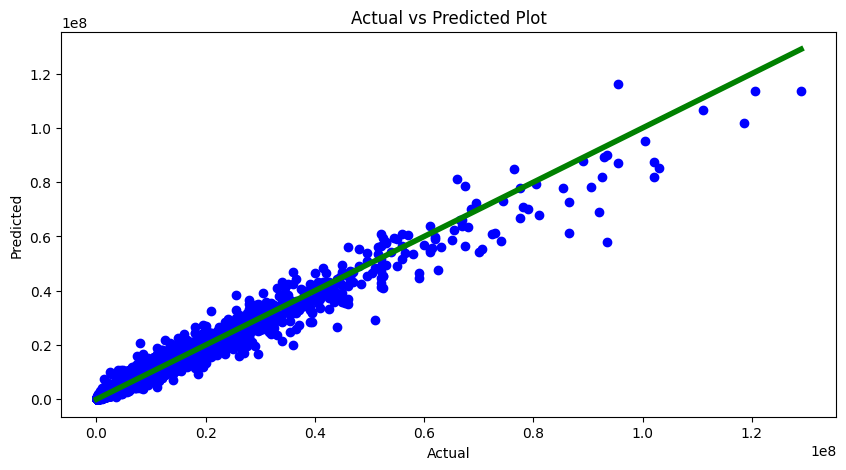

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_nn_opt3)

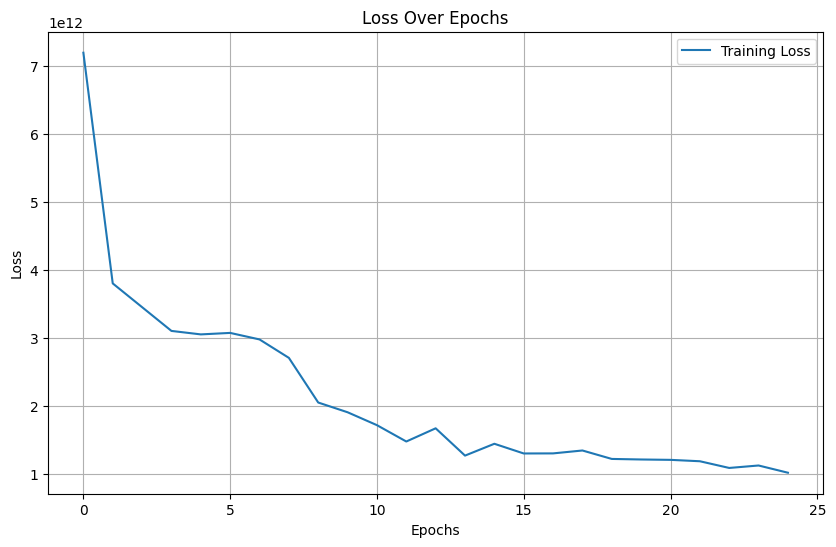

In [ ]:
# import
import matplotlib.pyplot as plt

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(nn_opt3.history['loss'], label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

##2.6 Sklearn Neural Network

### Train Model

Wir verwenden die gleiche Architektur wie in unserem Optimized Model 3 und führen zusätzlich ein early stoppping ein:

In [ ]:
#import
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np

# MLPRegressor and neural network architecture
model_mlp = MLPRegressor(hidden_layer_sizes=(512, 256, 128, 64, 32),
                         activation='relu',
                         solver='adam',
                         learning_rate_init=0.005,
                         batch_size = 64,
                         max_iter=200,
                         random_state=42,
                         early_stopping = True,
                         validation_fraction= 0.1
                         )

# fit on train
mlp = model_mlp.fit(X_train, y_train)

# predict on test and train
y_test_pred_mlp= mlp.predict(X_test)
y_train_pred_mlp= mlp.predict(X_train)

### Evaluate Model

In [ ]:
# calculate rmse
rmse_train_mlp = mean_squared_error(y_train, y_train_pred_mlp, squared = False)
rmse_test_mlp = mean_squared_error(y_test, y_test_pred_mlp, squared = False)

# print results
print(f'Neural Network Sklearn MLPRegressor:\n')
print(f'Train RMSE: {rmse_train_mlp}')
print(f'Test RMSE: {rmse_test_mlp}')

Neural Network Sklearn MLPRegressor:

Train RMSE: 790530.6781429746
Test RMSE: 841579.2684986222


Mit dem Sklearn MLPRegressor konnten wir den RMSE leicht verbessern und auch die Loss Curve sieht gut aus.

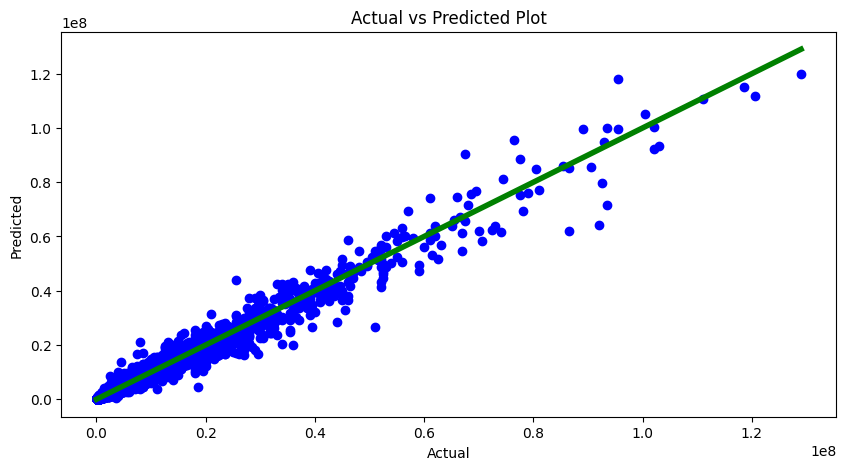

In [ ]:
# show scatter plot
actual_vs_predicted_plot(y_test, y_test_pred_mlp)

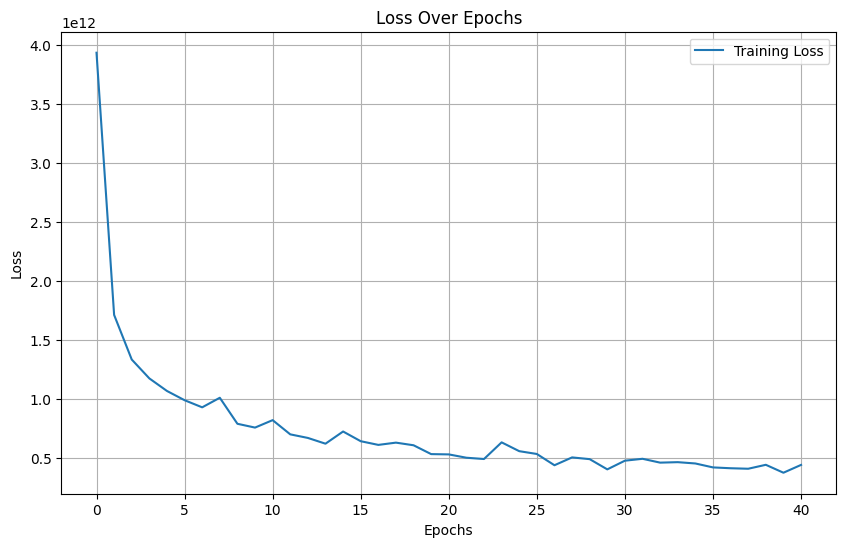

In [ ]:
# get loss curve
loss_values_mlp = mlp.loss_curve_

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(loss_values_mlp, label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
scores_mlp = cross_val_score(model_mlp, X, y, cv=5, scoring='neg_mean_squared_error')

In [ ]:
# calculate rmse for each fold
rmse_scores_mlp = np.sqrt(-scores_mlp)

# print results
print(f'RMSE scores for each fold:\n\n', rmse_scores_mlp)
print(f'\nMean RMSE:', rmse_scores_mlp.mean())

RMSE scores for each fold:

 [1137843.97208048  833355.39583356 1152463.23551376 1430548.14508062
 2644153.11630673]

Mean RMSE: 1439672.7729630307


Im Vergleich zum RandomForest und Gradient Boosting schneidet der MLPRegressor bei der Cross Validation besser ab. Im nächsten Abschnitt wird GridSearchCV verwendet, um die optimalen Parameter zu finden.

### Tune Model

In [ ]:
# import
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np

# define parameter to test
param_grid = {
    'hidden_layer_sizes': [(512, 256, 128, 64, 32), (256, 128, 64, 32)],
    'activation': ['relu'],
    'solver':['adam'],
    'learning_rate_init': [0.1, 0.05, 0.005],
    'batch_size': [64, 128],
    'max_iter': [10, 50, 200]
}

# Gradient Boosting Regressor
model_mlp_opt = MLPRegressor(random_state=42)

# GridSearchCV
grid_search = GridSearchCV(estimator=model_mlp_opt, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# fit on train subset
grid_search.fit(X_train_subset, y_train_subset)

# get and print best parameters
best_params = grid_search.best_params_
print(f'Best parameters: {best_params}')

Best parameters: {'activation': 'relu', 'batch_size': 64, 'hidden_layer_sizes': (256, 128, 64, 32), 'learning_rate_init': 0.005, 'max_iter': 200, 'solver': 'adam'}


Einsetzen der optimalen Parameter ins Modell:

In [ ]:
# import
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np

# MLPRegressor and neural network architecture
model_mlp_opt = MLPRegressor(hidden_layer_sizes=(256, 128, 64, 32),
                         activation='relu',
                         solver='adam',
                         learning_rate_init=0.005,
                         batch_size = 64,
                         max_iter=200,
                         random_state=42,
                         early_stopping = True,
                         validation_fraction= 0.2
                         )

# fit on train
mlp_opt = model_mlp_opt.fit(X_train, y_train)

# predict on test and train
y_test_pred_mlp_opt= mlp_opt.predict(X_test)
y_train_pred_mlp_opt= mlp_opt.predict(X_train)

In [ ]:
# calculate rmse
rmse_train_mlp_opt = mean_squared_error(y_train, y_train_pred_mlp_opt, squared = False)
rmse_test_mlp_opt = mean_squared_error(y_test, y_test_pred_mlp_opt, squared = False)

# print results
print(f'Neural Network Sklearn MLPRegressor Optimized:\n')
print(f'Train RMSE: {rmse_train_mlp_opt}')
print(f'Test RMSE: {rmse_test_mlp_opt}')

Neural Network Sklearn MLPRegressor Optimized:

Train RMSE: 1293562.754628618
Test RMSE: 1296698.0532233429


Entgegen der Annahme hat sich der RMSE aufgrund der optimalen Parameter verschlechtert. Allerdings ist die Abweichung zwischen Train - und Test RMSE nicht sehr gross, was darauf hindeuten könnte, dass das Modell einigermassen gut generalisiert. Die Loss Curve zeigt, dass das Modell ab Epoche 30 nur noch sehr langsam lernt. Der Loss nimmt jedoch stetig ab.

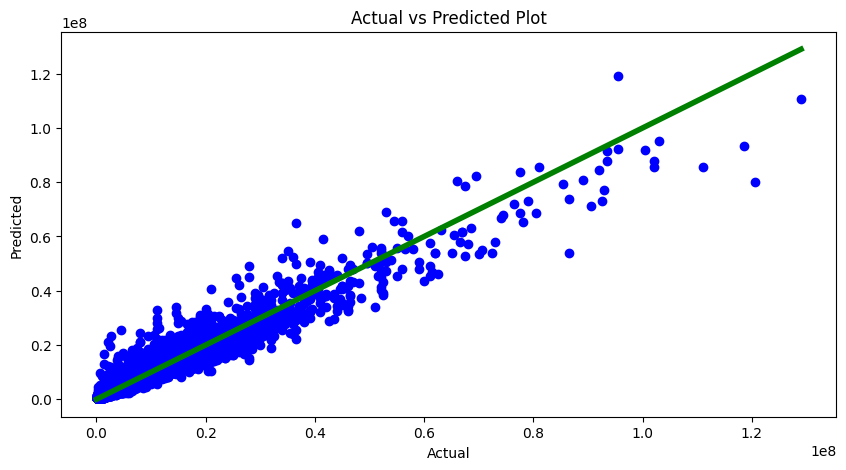

In [ ]:
# plot scatter
actual_vs_predicted_plot(y_test, y_test_pred_mlp_opt)

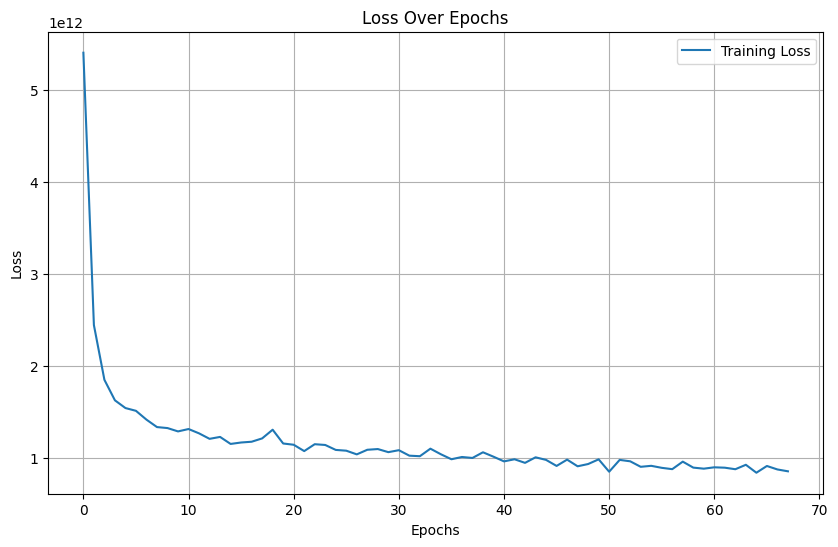

In [ ]:
# get loss curve
loss_values_mlp_opt = mlp_opt.loss_curve_

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(loss_values_mlp_opt, label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

##2.7 Stacking

In diesem Kapitel versuchen wir, unsere Modelle zu stacken und hoffen, durch die Kombination ein besseres Ergebnis zu erzielen.

### Train Model
Wir verwenden das GradientBoosting und RandomForest Modell. Als meta learner nehmen wir den XGBRegressor.

In [ ]:
# import
from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# define estimators for stacking
estimators = [
    ('gbr_opt', model_gbr_opt),
    ('forest', model_random_opt )
]

In [ ]:
#import
from xgboost import XGBRegressor

# meta learner
final_estimator = XGBRegressor(objective='reg:squarederror', n_estimators=150, learning_rate = 0.05, random_state=42)

# stacking regressor
model_stack = StackingRegressor(estimators=estimators, final_estimator=final_estimator, cv=5)

In [ ]:
# fit on train
stack = model_stack.fit(X_train, y_train)

# predict on test and train
y_test_pred_stack= stack.predict(X_test)
y_train_pred_stack= stack.predict(X_train)

In [ ]:
stack

StackingRegressor(cv=5,
                  estimators=[('gbr_opt',
                               GradientBoostingRegressor(learning_rate=0.2,
                                                         max_depth=4,
                                                         n_estimators=200,
                                                         random_state=42)),
                              ('forest',
                               RandomForestRegressor(max_depth=10,
                                                     n_estimators=150,
                                                     random_state=42))],
                  final_estimator=XGBRegressor(base_score=None, booster=None,
                                               callbacks=None,
                                               colsample_bylevel=None,
                                               colsample_bynode=None,
                                               colsample_bytr...
                                               feature_types=None, gamma=None,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=0.05, max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None,
                                               max_depth=None, max_leaves=None,
                                               min_child_weight=None,
                                               missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=150, n_jobs=None,
                                               num_parallel_tree=None,
                                               random_state=42, ...))

### Evaluate Model

In [ ]:
# calculate rmse
rmse_train_stack = mean_squared_error(y_train, y_train_pred_stack, squared = False)
rmse_test_stack = mean_squared_error(y_test, y_test_pred_stack, squared = False)

# print results
print(f'Stack Model:\n')
print(f'Train RMSE: {rmse_train_stack}')
print(f'Test RMSE: {rmse_test_stack}')

Stack Model:

Train RMSE: 1361983.8030064262
Test RMSE: 1382392.5638059187


Der StackingRegressor schneidet schlechter ab als die einzelnen Modelle. Auch der scatter plot sieht nicht gut aus, da die blauen Punkte teilweise horizontal sind.

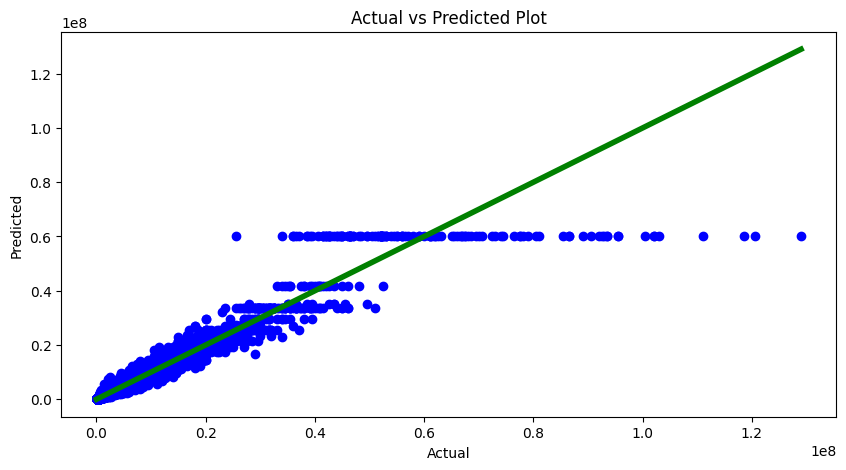

In [ ]:
# plot scatter
actual_vs_predicted_plot(y_test, y_test_pred_stack)

# 3 Optimizing for Kaggle with Feature Engineering

Da die Ergebnisse der bisherigen Modelle nicht zufriedenstellend waren und auch im Kaggle-Wettbewerb nicht besonders gut abgeschnitten haben, versuchen wir, die Vorhersagefähigkeit durch weiteres Feature Engineering zu verbessern.

## 3.1 Deleting Features

In [ ]:
df_scaled

,ID,potential,age,league_level,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,club_contract_valid_until,height_cm,year,value_eur
0,-0.999854,2.777778,0.285714,0.0,2.0,4.0,1.785714,1.761905,2.101449,2.615385,-1.035714,-0.666667,-1.2,-0.75,100500000.0
1,-0.999837,2.444444,0.571429,0.0,3.0,4.0,1.785714,1.952381,1.739130,2.230769,-0.857143,-0.666667,0.4,-0.75,79000000.0
2,-0.999821,2.222222,0.714286,0.0,2.0,4.0,1.785714,1.619048,1.884058,2.307692,-0.857143,-1.000000,-0.1,-0.75,54500000.0
3,-0.999805,2.222222,1.000000,0.0,2.0,4.0,0.571429,1.857143,1.739130,1.846154,-0.785714,-1.333333,1.4,-0.75,52500000.0
4,-0.999789,2.222222,0.428571,0.0,-1.0,4.0,0.142857,0.657143,1.521739,1.353846,0.478571,-0.333333,1.2,-0.75,63500000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121266,0.998503,-2.000000,-0.571429,0.0,0.0,0.0,-0.714286,-1.380952,-2.246377,-2.692308,-0.214286,0.000000,-0.4,0.75,70000.0
121267,0.998520,-1.888889,-0.571429,0.0,0.0,0.0,-0.714286,-0.952381,-0.579710,-1.153846,-0.464286,0.666667,-0.7,0.75,70000.0
121268,0.998536,-2.555556,0.428571,0.0,0.0,0.0,-0.214286,-0.714286,-0.579710,-1.230769,-0.571429,0.666667,0.4,0.75,45000.0
121269,0.998552,-0.333333,-1.142857,3.0,0.0,0.0,0.142857,-0.285714,-1.231884,-0.692308,-1.428571,0.333333,-1.0,0.75,130000.0


In [ ]:
# Source: ChatGPT, Prompt: How to do pca analysis

# import
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler
import numpy as np

# PCA
pca = PCA()
pca.fit(X)

# variance explained
explained_variance = pca.explained_variance_ratio_

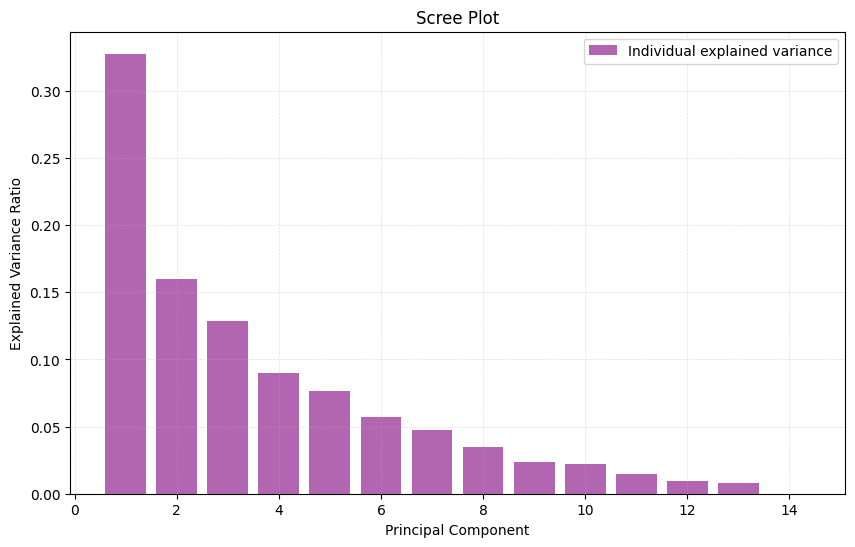

In [ ]:
# # Source: ChatGPT, pca analysis plot

plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.6, align="center", label="Individual explained variance", color= "purple")
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot')
plt.grid(linestyle='--', linewidth=0.5, alpha=0.4)
plt.legend()
plt.show()

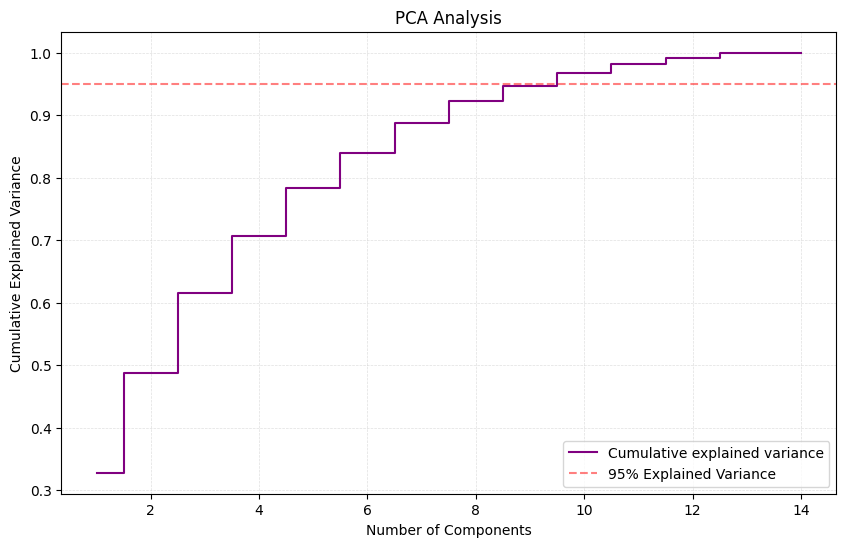

In [ ]:
# # Source: ChatGPT, pca analysis plot

# cumulative explained variance
cumulative_variance = np.cumsum(explained_variance)

# cumulative variance plot
plt.figure(figsize=(10, 6))
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where="mid", label="Cumulative explained variance", color ="purple")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Analysis")
plt.axhline(y = 0.95, color="red", linestyle="--", label="95% Explained Variance", alpha = 0.5)
plt.grid(linestyle='--', linewidth=0.5, alpha=0.4)
plt.legend()
plt.show()

Die PCA Analyse zeigt, dass 9 Components 95 % der Varianz erklären. Der Scree Plot veranschaulicht uns, dass die Explained Variance Ratio etwa ab Component 7 abflacht und dass weitere Components keine Erklärungskraft mehr haben für die Varainz. Wir löschen daher 6 Features und versuchen, eines der Modelle zu verbessern, um ein gutes Kaggle Ergebnis zu erzielen. Welche gestrichen werden, wurde auf der Grundlage des Pair Plots in Kapitel 1 und der verschiedenen Variance Importance Plots entschieden. Die Variabel ID wurde entfernt, da angenommen wird, dass diese keinen Informationsgehalt hat für den Transfermarktwert eines Spielers.

In [ ]:
df_scaled_comp = df_scaled.drop(columns=["league_level", "skill_moves","height_cm", "club_contract_valid_until", "year","ID" ])

In [ ]:
# import
from sklearn.model_selection import train_test_split

# split into train and test
X_comp = df_scaled_comp.drop("value_eur", axis=1)
y_comp= df_scaled_comp["value_eur"]

X_train_comp, X_test_comp, y_train_comp, y_test_comp = train_test_split(X_comp, y_comp, test_size=0.3, random_state = 42)

In [ ]:
# print shapes
print("Original Set:", train.shape)

print("Train Set:", X_train.shape, y_train.shape)
print("Test Set:", X_test.shape, y_test.shape)

print("Competition Train Set:", X_train_comp.shape, y_train_comp.shape)
print("Competition Test Set:", X_test_comp.shape, y_test_comp.shape)

Original Set: (121271, 15)
Train Set: (84889, 14) (84889,)
Test Set: (36382, 14) (36382,)
Competition Train Set: (84889, 8) (84889,)
Competition Test Set: (36382, 8) (36382,)


In [ ]:
X_train_comp

,potential,age,international_reputation,pace,shooting,passing,dribbling,defending
47086,-0.333333,-0.857143,0.0,-0.642857,-1.142857,-2.246377,-2.307692,0.071429
81146,-1.000000,0.285714,0.0,-0.214286,0.428571,-0.942029,-0.153846,-1.107143
48902,1.444444,0.428571,2.0,-0.571429,1.476190,0.000000,0.153846,-0.464286
96714,-0.111111,-0.142857,0.0,-1.142857,-1.285714,-1.159420,-1.384615,0.178571
61312,-0.777778,0.428571,0.0,-0.371429,-0.761905,-0.623188,-0.676923,0.207143
...,...,...,...,...,...,...,...,...
110268,-0.333333,0.285714,0.0,-0.214286,0.666667,-0.434783,0.076923,-0.964286
119879,0.111111,-0.714286,0.0,-0.857143,0.238095,-1.376812,-1.230769,-1.214286
103694,2.000000,-0.714286,0.0,1.214286,1.142857,0.869565,1.230769,-1.107143
860,1.777778,-0.714286,0.0,0.500000,0.952381,1.231884,1.461538,-0.964286


## 3.2 Model



Wir trainieren nun je ein neues MLPRegressor, Gradient Boosting und RandomForest Modell. Da die GridSearchCV Funktion die optimalen Parameter für die vergangenen Modelle gesucht hat, wobei noch auf alle Features gefitted wurde, kann man diese Parameter für die neuen Modelle nicht mehr anwenden (in Kaggle getestet und schlecht abgeschnitten).

Wir versuchen es mit einer höheren Anzahl von n_estimators und einer höheren max_depth für das GradientBoosting- und RandomForest-Modell, da GridSearchCV für die vorherigen Modelle jeweils den höchsten Wert für n_estimators und max_depth  aus dem Grid vorgeschlagen hat.

### MLPRegressor

In [ ]:
# import
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np

# MLPRegressor and neural network architecture
model_mlp_opt_comp = MLPRegressor(hidden_layer_sizes=(8, 16, 32, 64, 128, 256, 512),
                         activation='relu',
                         solver='adam',
                         learning_rate_init=0.005,
                         batch_size = 64,
                         max_iter=200,
                         random_state=42,
                         early_stopping = True,
                         validation_fraction= 0.2
                         )

# fit on train
mlp_opt_comp = model_mlp_opt_comp.fit(X_train_comp, y_train_comp)

# predict on test and train
y_test_pred_mlp_opt_comp = mlp_opt_comp.predict(X_test_comp)
y_train_pred_mlp_opt_comp = mlp_opt_comp.predict(X_train_comp)

In [ ]:
# calculate rmse
rmse_train_mlp_opt_comp = mean_squared_error(y_train_comp, y_train_pred_mlp_opt_comp, squared = False)
rmse_test_mlp_opt_comp = mean_squared_error(y_test_comp, y_test_pred_mlp_opt_comp, squared = False)

# print results
print(f'Neural Network Sklearn MLPRegressor Optimized:\n')
print(f'Train RMSE: {rmse_train_mlp_opt_comp}')
print(f'Test RMSE: {rmse_test_mlp_opt_comp}')

Neural Network Sklearn MLPRegressor Optimized:

Train RMSE: 1628011.4889331104
Test RMSE: 1587273.9562855442


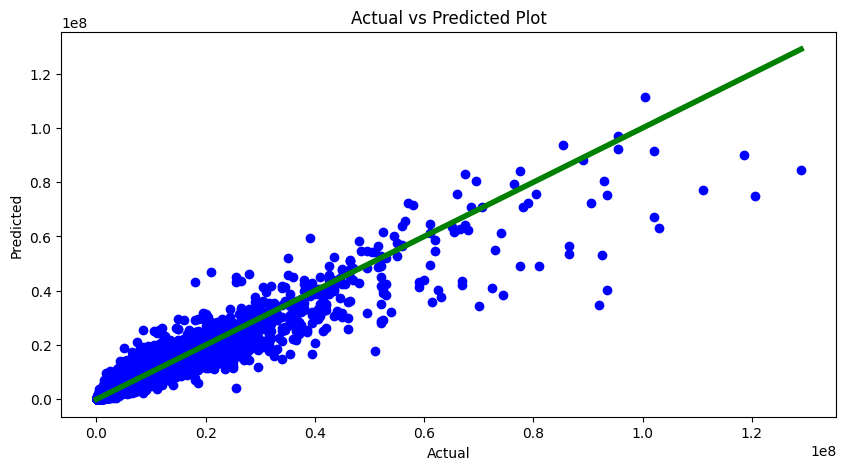

In [ ]:
# plot scatter
actual_vs_predicted_plot(y_test_comp, y_test_pred_mlp_opt_comp)

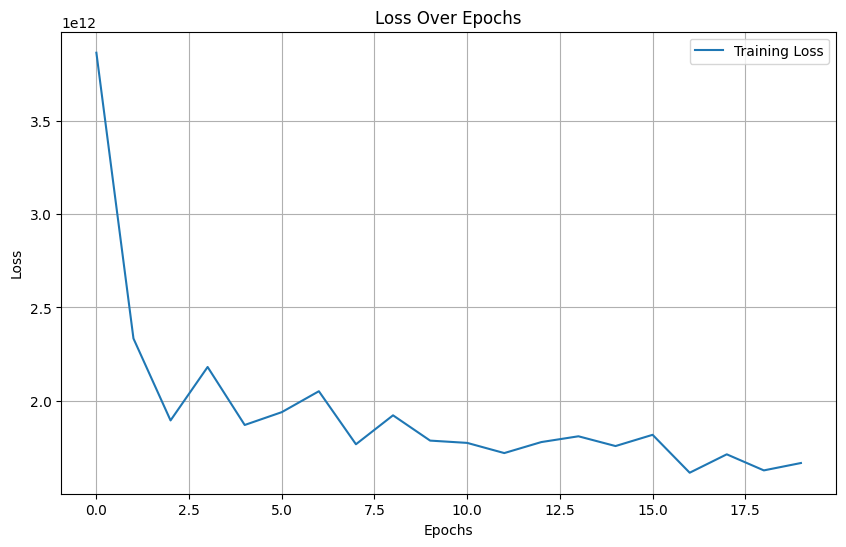

In [ ]:
# get loss curve
loss_values_mlp_opt_comp = mlp_opt_comp.loss_curve_

# plot training loss
plt.figure(figsize=(10, 6))
plt.plot(loss_values_mlp_opt_comp, label='Training Loss')

# add title, labels, legend, grid
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# show
plt.show()

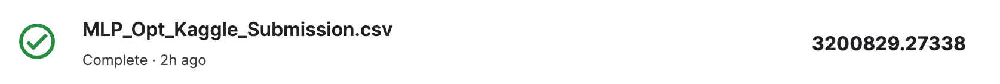

### GradientBoosting

In [ ]:
# import
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Gradient Boosting Regressor
model_gbr_opt_comp = GradientBoostingRegressor(random_state = 42,
                                          learning_rate = 0.2,
                                          max_depth = 10,
                                          min_samples_leaf = 2,
                                          min_samples_split = 3,
                                          n_estimators = 400)
# fit on train
gbr_opt_comp = model_gbr_opt_comp.fit(X_train_comp, y_train_comp)

# predict on test and train
y_test_pred_gbr_opt_comp = gbr_opt_comp.predict(X_test_comp)
y_train_pred_gbr_opt_comp = gbr_opt_comp.predict(X_train_comp)

In [ ]:
# calculate rmse
rmse_train_gbr_opt_comp = mean_squared_error(y_train_comp, y_train_pred_gbr_opt_comp, squared = False)
rmse_test_gbr_opt_comp = mean_squared_error(y_test_comp, y_test_pred_gbr_opt_comp, squared = False)

# print results
print(f'Neural Network Sklearn MLPRegressor Optimized:\n')
print(f'Train RMSE: {rmse_train_gbr_opt_comp}')
print(f'Test RMSE: {rmse_test_gbr_opt_comp}')

Neural Network Sklearn MLPRegressor Optimized:

Train RMSE: 122579.14270798163
Test RMSE: 1666213.8468033653


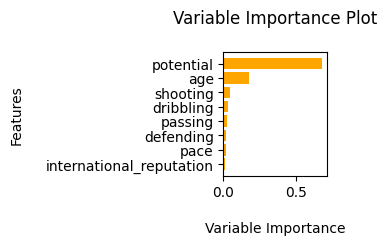

In [ ]:
# plot variable importance
plot_variable_importance(gbr_opt_comp, X_train_comp)

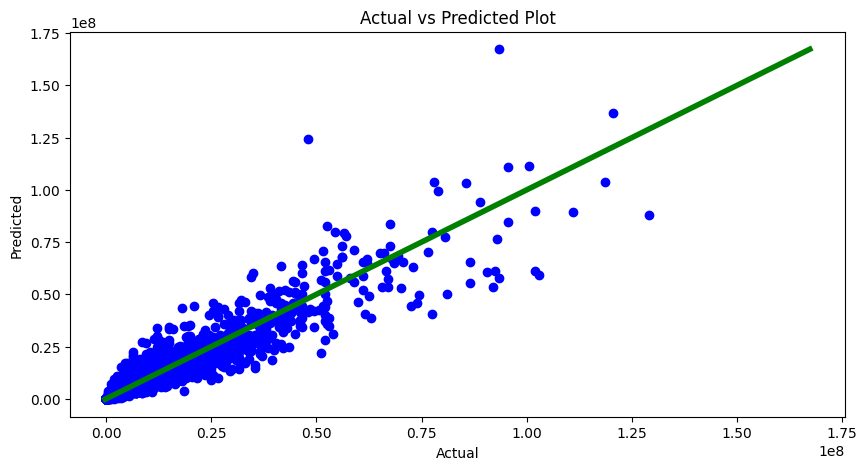

In [ ]:
# plot scatter
actual_vs_predicted_plot(y_test_comp, y_test_pred_gbr_opt_comp)

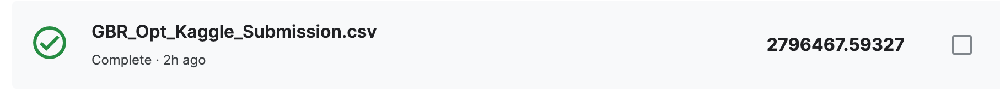

### RandomForest

In [ ]:
# import
from sklearn.ensemble import RandomForestRegressor

# instantiate model
model_random_opt_comp  = RandomForestRegressor(n_estimators = 200,
                                      max_depth = 15,
                                      min_samples_leaf = 1,
                                      min_samples_split = 4,
                                      random_state = 42)

# fit model on train
randomforest_opt_comp = model_random_opt_comp.fit(X_train_comp, y_train_comp)

# predict on test and train
y_test_pred_random_opt_comp = randomforest_opt_comp.predict(X_test_comp)
y_train_pred_random_opt_comp = randomforest_opt_comp.predict(X_train_comp)


In [ ]:
# calculate rmse
rmse_train_random_opt_comp = mean_squared_error(y_train_comp, y_train_pred_random_opt_comp, squared = False)
rmse_test_random_opt_comp = mean_squared_error(y_test_comp, y_test_pred_random_opt_comp, squared = False)

# print results
print(f'Random Forest Optimized:\n')
print(f'Train RMSE: {rmse_train_random_opt_comp}')
print(f'Test RMSE: {rmse_test_random_opt_comp}')

Random Forest Optimized:

Train RMSE: 792539.353869345
Test RMSE: 1546802.209919056


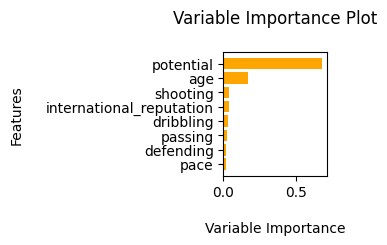

In [ ]:
# plot variable importance
plot_variable_importance(randomforest_opt_comp, X_train_comp)

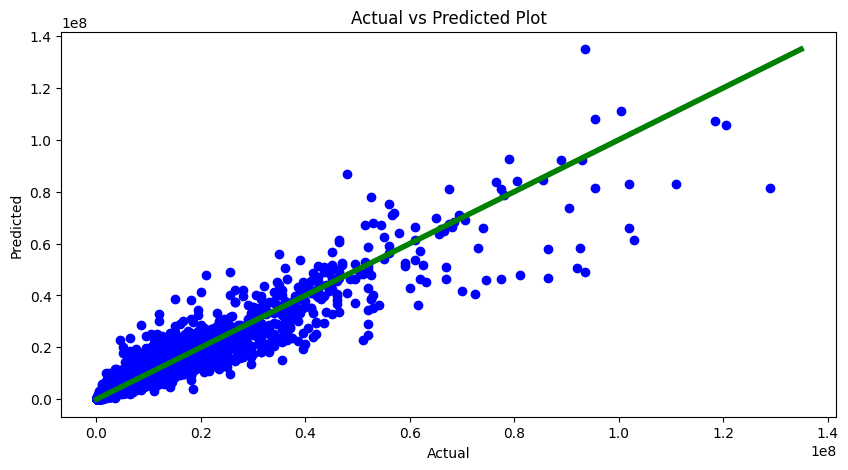

In [ ]:
# plot scatter
actual_vs_predicted_plot(y_test_comp, y_test_pred_random_opt_comp)

In [ ]:
# import
from sklearn.model_selection import GridSearchCV

# define parameters to test
param_grid = {
    'n_estimators': [200, 500, 800],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 3],
}
# Gradient Boosting Regressor
random = RandomForestRegressor(random_state=42)

# GridSearchCV
grid_search = GridSearchCV(estimator=random, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# fit to subset train data
grid_search.fit(X_train_comp, y_train_comp)

# get and print best parameters
best_params = grid_search.best_params_
print(f'Best parameters: {best_params}')

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters: {'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 200}


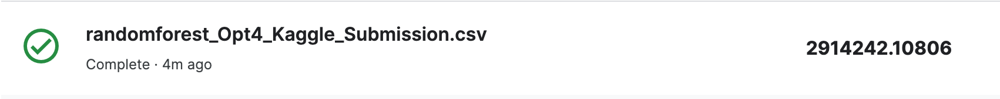

# Fazit

Letztendlich konnten wir auch mit dem erweiterten Feature Engineering kein sehr gutes Modell erstellen, da die MRSEs im Testset trotzdem alle höher waren. Wir konnten aber unser bestes Kaggle Ergebnis mit dem GradientBoostingRegressor erzielen. Mit noch mehr Zeit und mehr Rechenleistung für das Hyperparameter Tuning wäre sicherlich ein besseres Modell möglich gewesen. Die grössten Hürden waren die langen Ladezeiten und die begrenzten Recheneinheiten von Google Colab. Es wäre auch sinnvoller gewesen, die Modelle nicht nur am Ende, sondern fortlaufend auf Kaggle zu testen, um beurteilen zu können, ob man auf dem richtigen Weg ist.

Kaggle-Name: Mourinho101

# Save Results for Submission

Make predictions on the competition data with your trained model

In [ ]:
comp_data_scaled = scaler.transform(comp_data)

In [ ]:
comp_data_scaled

array([[-0.7616158 , -0.11111111, -0.42857143, ...,  1.33333333,
         1.4       ,  1.        ],
       [-0.86389666,  0.33333333, -0.42857143, ...,  1.33333333,
        -0.3       ,  1.        ],
       [-0.86571875,  0.22222222, -0.28571429, ...,  1.66666667,
        -0.1       ,  1.        ],
       ...,
       [-0.77197892,  0.11111111, -0.28571429, ...,  1.33333333,
        -1.        ,  1.        ],
       [-0.91834776,  0.        ,  0.42857143, ...,  0.33333333,
        -0.3       ,  1.        ],
       [-0.95273964,  0.33333333,  0.28571429, ...,  1.        ,
         0.8       ,  1.        ]])

In [ ]:
#create a DataFrame for the scaled data
df_comp_data_scaled = pd.DataFrame(comp_data_scaled, columns = ["ID",
                                           "potential",
                                           "age",
                                           "league_level",
                                           "skill_moves",
                                           "international_reputation",
                                           "pace",
                                           "shooting",
                                           "passing",
                                           "dribbling",
                                           "defending",
                                           "club_contract_valid_until",
                                           "height_cm",
                                           "year"])

Small Dataset:

In [ ]:
comp_predictions= randomforest_opt_comp.predict(df_comp_data_scaled.drop(columns=["league_level", "skill_moves","height_cm", "club_contract_valid_until", "year","ID" ]))

Full Dataset

In [ ]:
comp_predictions= stack.predict(df_comp_data_scaled)

Submission

In [ ]:
model_name = "randomforest_Opt4_Kaggle_Submission.csv"

In [ ]:
def save_submission_for_kaggle(model_name, comp_predictions, comp_data):
  import pandas as pd
  submission_data = pd.DataFrame({"ID": comp_data["ID"], "Actual": comp_predictions})
  submission_data.to_csv(model_name, index=False)

## Save submission file

In [ ]:
save_submission_for_kaggle(model_name, comp_predictions, comp_data)

In [ ]:
try:
  from google.colab import files
  files.download(model_name)
except ModuleNotFoundError:
  print("Not using Google Colab")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>